VGG and  ResNet


## Step 1: Data preparation

In [ ]:
import numpy
import seaborn
import matplotlib.pyplot as plot
import torch
import torchinfo
from torch.utils.data import DataLoader, random_split, WeightedRandomSampler
from torchvision import datasets, transforms
from sklearn.metrics import precision_recall_fscore_support, confusion_matrix
from torch.utils.tensorboard import SummaryWriter


transform = transforms.Compose([    # Applying transformation
    transforms.Grayscale(num_output_channels=3),    # Convert grayscale to 3 output channels
    transforms.Resize((224, 224)),      # Resizing the images to 224x224 which is standard for VGG
    transforms.RandomHorizontalFlip(),  # Flip images randomly
    transforms.RandomRotation(15),  # Rotate randomly
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Adjust colors
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])     # Normalization for VGG 16
])


# Load dataset using ImageFolder and processing the dataset
cnnDataset = datasets.ImageFolder(root = 'cnn_dataset', transform = transform)

In [40]:
# Analysing the Dataset
print("Class labels:", cnnDataset.classes)
print("Number of classes:", len(cnnDataset.classes))
print(f"Total number of samples: {len(cnnDataset)}")

Class labels: ['dogs', 'food', 'vehicles']
Number of classes: 3
Total number of samples: 30000


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


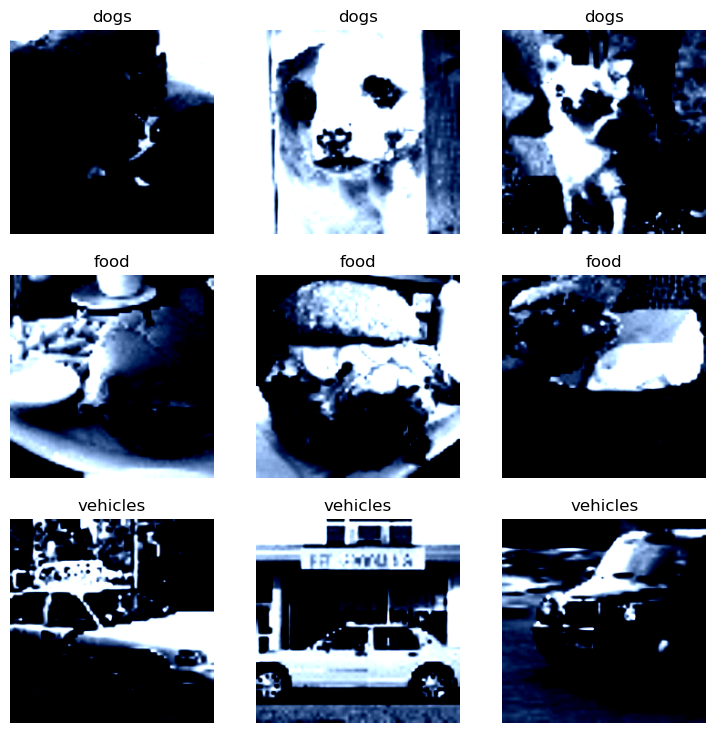

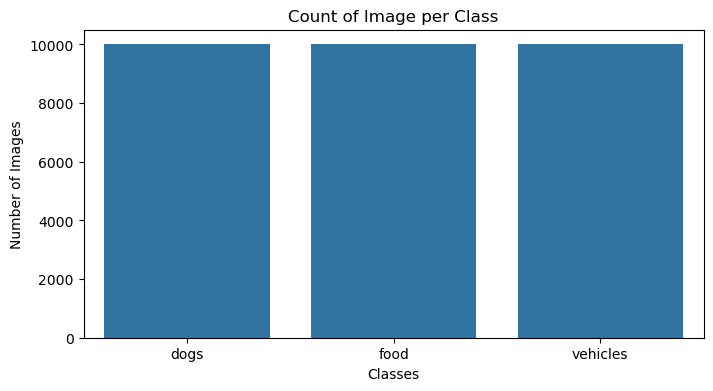

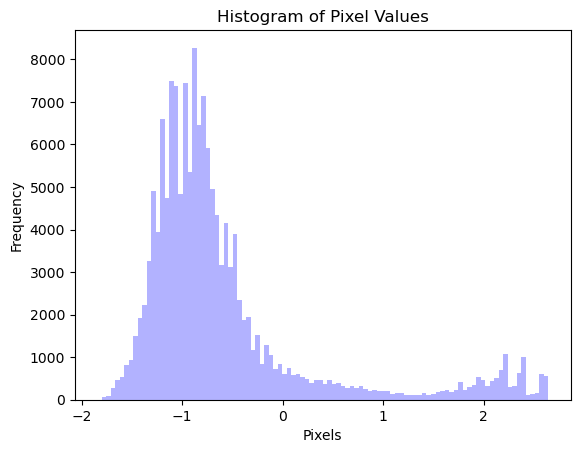

In [ ]:
countOfClasses = {i: 0 for i in cnnDataset.classes}
for _, label in cnnDataset.samples:
    countOfClasses[cnnDataset.classes[label]] = countOfClasses[cnnDataset.classes[label]] + 1

def showImagesPerLabel(cnnDataset, numImages=3):
    classImages = {classes: [] for classes in cnnDataset.classes}
    for img, label in cnnDataset:
        className = cnnDataset.classes[label]
        if len(classImages[className]) < numImages:
            classImages[className].append(img)
        if all(len(imgs) == numImages for imgs in classImages.values()):
            break
    
    fig, axes = plot.subplots(len(cnnDataset.classes), numImages, figsize=(numImages * 3, len(cnnDataset.classes) * 3))
    for i, (classes, imgs) in enumerate(classImages.items()):
        for j, img in enumerate(imgs):
            ax = axes[i, j]
            ax.imshow(numpy.transpose(img.numpy(), (1, 2, 0)))
            ax.set_title(classes)
            ax.axis('off')
    plot.show()

showImagesPerLabel(cnnDataset, numImages=3)

# Bar plot of class distribution
classCountValues = list(countOfClasses.values())
plot.figure(figsize=(8, 4))
seaborn.barplot(y= classCountValues, x=list(countOfClasses.keys()))
plot.title("Count of Image per Class")
plot.xlabel("Classes")
plot.ylabel("Number of Images")
plot.xticks(rotation = 0)
plot.show()


# Histogram of Pixels
plot.hist(cnnDataset[0][0].numpy().flatten(), alpha=0.3, bins=100, color='blue')
plot.xlabel("Pixels")
plot.ylabel("Frequency")
plot.title("Histogram of Pixel Values")
plot.show()

In [ ]:
# Calculate class weights
sampleWeights = [1.0 / numpy.array(classCountValues)[label] for _, label in cnnDataset]

sampler = WeightedRandomSampler(sampleWeights, len(cnnDataset)) # Creating sampler

trainLoader = DataLoader(cnnDataset, batch_size=32, sampler=sampler) # DataLoader with sampler

In [ ]:
# Split dataset into 70% train, 15% validation, 15% test
trainValSize = int(0.85 * len(cnnDataset))
testSize = len(cnnDataset) - trainValSize
trainValDataset, testDataset = random_split(cnnDataset, [trainValSize, testSize])

trainSize = int(0.7 * len(trainValDataset))
valSize = len(trainValDataset) - trainSize
trainDataset, valDataset = random_split(trainValDataset, [trainSize, valSize])

# Create DataLoader
trainLoader = DataLoader(trainDataset, batch_size=32, shuffle=True)
valLoader = DataLoader(valDataset, batch_size=32, shuffle=False)
testLoader = DataLoader(testDataset, batch_size=32, shuffle=False)

## Step 2: Implementing VGG

In [ ]:
class VGG16(torch.nn.Module):
    def __init__(self, numClasses=3, batchNorm=False, dropout = 0.3):
        super(VGG16, self).__init__()

        def convLayer(in_channels, out_channels, batchNorm): # For batch normalization
            layers = [torch.nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                      torch.nn.ReLU(inplace=True)]
            if batchNorm:
                layers.append(torch.nn.BatchNorm2d(out_channels))
            return layers

        self.features = torch.nn.Sequential(
            *convLayer(3, 64, batchNorm),
            *convLayer(64, 64, batchNorm),
            torch.nn.MaxPool2d(kernel_size=2, stride=2), # Starting with 64

            *convLayer(64, 128, batchNorm),
            *convLayer(128, 128, batchNorm),
            torch.nn.MaxPool2d(kernel_size=2, stride=2),

            *convLayer(128, 256, batchNorm),
            *convLayer(256, 256, batchNorm),
            *convLayer(256, 256, batchNorm),
            torch.nn.MaxPool2d(kernel_size=2, stride=2),

            *convLayer(256, 512, batchNorm),
            *convLayer(512, 512, batchNorm),
            *convLayer(512, 512, batchNorm),
            torch.nn.MaxPool2d(kernel_size=2, stride=2),

            *convLayer(512, 512, batchNorm),              # ending with 512
            *convLayer(512, 512, batchNorm),
            *convLayer(512, 512, batchNorm),
            torch.nn.MaxPool2d(kernel_size=2, stride=2),
        )

        # Fully connected layers
        self.classifier = torch.nn.Sequential(
            torch.nn.Linear(25088, 4096),  # input size for the FC
            torch.nn.ReLU(inplace=True),
            torch.nn.Dropout(dropout),
            torch.nn.Linear(4096, 4096),
            torch.nn.ReLU(inplace=True),
            torch.nn.Dropout(dropout),
            torch.nn.Linear(4096, numClasses) # Output layer: 3
        )

    def forward(self, x): # forward function
        x = self.features(x)       # x features
        x = x.view(x.size(0), -1)  # Flattening the x
        x = self.classifier(x)
        return x




In [50]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = VGG16(numClasses=3).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = torch.nn.CrossEntropyLoss()

# Initialize weights
def initializeWeights(model, weightType='xavier'):
    for m in model.modules():
        if isinstance(m, torch.nn.Conv2d) or isinstance(m, torch.nn.Linear):
            if weightType == 'he':
                torch.nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif weightType == 'xavier':
                torch.nn.init.xavier_uniform_(m.weight)
            elif weightType == 'normal':
                torch.nn.init.normal_(m.weight, mean=0, std=0.01)
            else:
                raise ValueError(f"Unknown weight initialization method {weightType}")
            if m.bias is not None:
                torch.nn.init.zeros_(m.bias)

print(torchinfo.summary(model, input_size=(1, 3, 224, 224)))  # Single image, 3 channels (RGB), 224x224

Layer (type:depth-idx)                   Output Shape              Param #
VGG16                                    [1, 3]                    --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         1,792
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         36,928
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        73,856
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        147,584
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]          29


Experimenting with: Optimizer = adam
Iteration 1/10: Train Loss: 0.7342, Train Accuracy: 72.5843%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 2/10: Train Loss: 0.7327, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 3/10: Train Loss: 0.7320, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 4/10: Train Loss: 0.7319, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 5/10: Train Loss: 0.7326, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 6/10: Train Loss: 0.7327, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 7/10: Train Loss: 0.7323, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 8/10: Train Loss: 0.7329, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 9/10: Train Loss: 0.7322, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 10/10: Train Loss: 0.7320

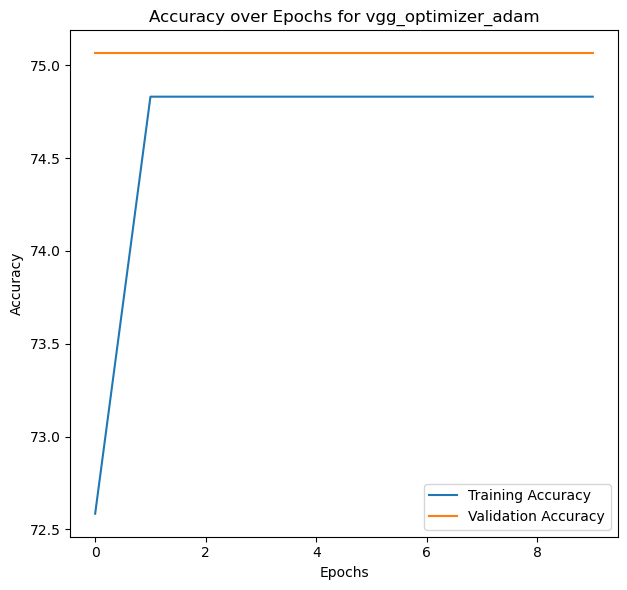

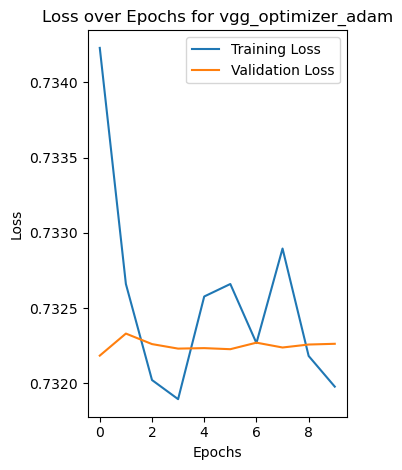

<Figure size 640x480 with 0 Axes>

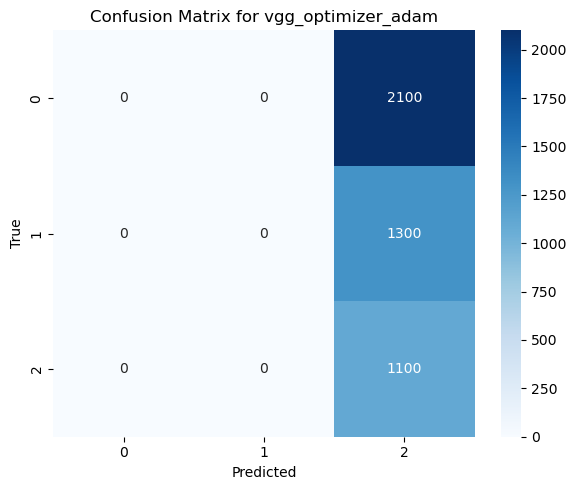

<Figure size 640x480 with 0 Axes>

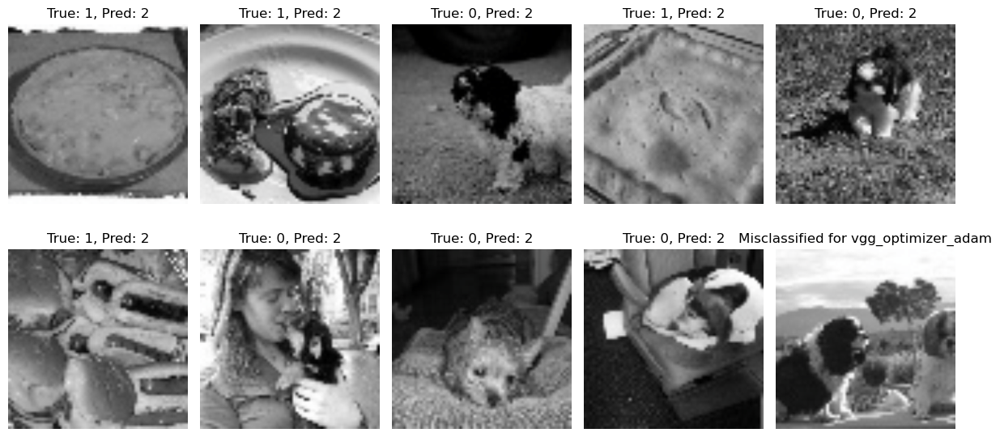


Experimenting with: Optimizer = sgd
Iteration 1/10: Train Loss: 0.7320, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 2/10: Train Loss: 0.7322, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 3/10: Train Loss: 0.7321, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 4/10: Train Loss: 0.7323, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 5/10: Train Loss: 0.7322, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 6/10: Train Loss: 0.7319, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 7/10: Train Loss: 0.7324, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 8/10: Train Loss: 0.7323, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 9/10: Train Loss: 0.7319, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 10/10: Train Loss: 0.7318,

<Figure size 640x480 with 0 Axes>

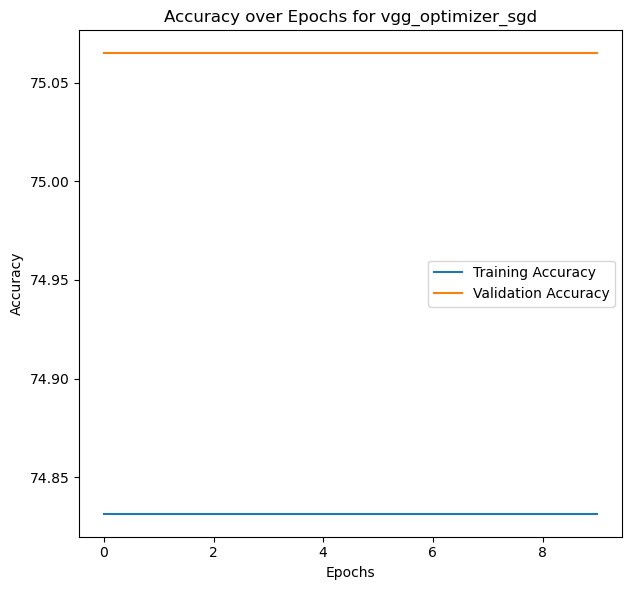

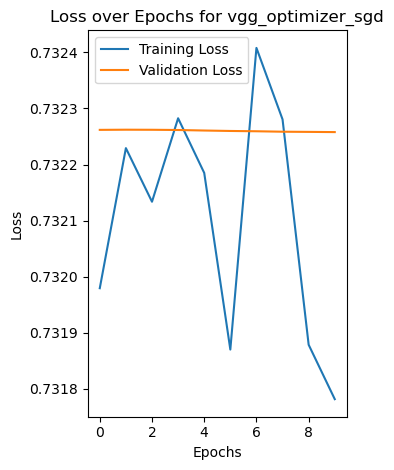

<Figure size 640x480 with 0 Axes>

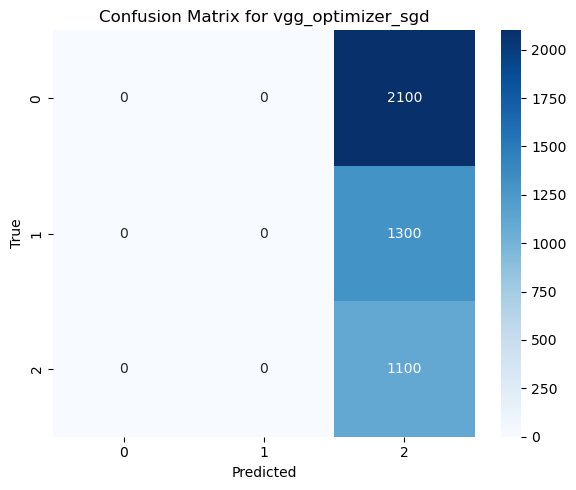

<Figure size 640x480 with 0 Axes>

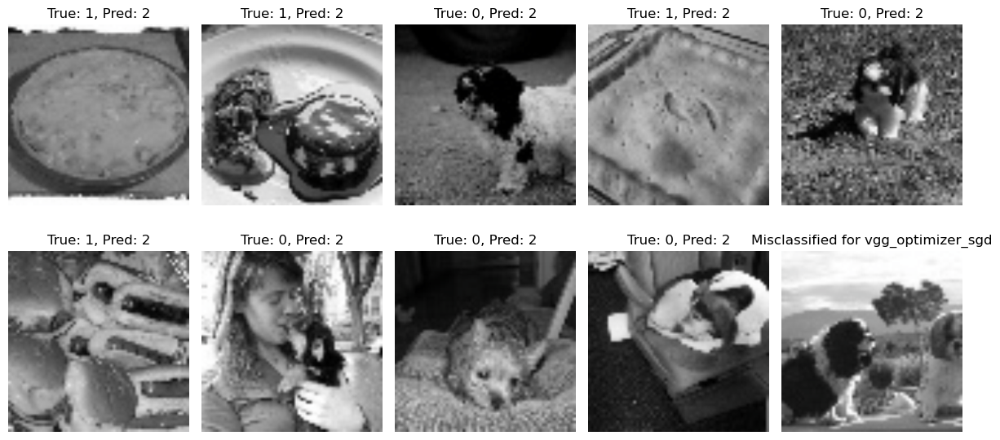


Experimenting with: Optimizer = adamw
Iteration 1/10: Train Loss: 0.7325, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 2/10: Train Loss: 0.7325, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 3/10: Train Loss: 0.7326, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 4/10: Train Loss: 0.7323, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 5/10: Train Loss: 0.7320, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 6/10: Train Loss: 0.7324, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 7/10: Train Loss: 0.7327, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 8/10: Train Loss: 0.7318, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 9/10: Train Loss: 0.7320, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 10/10: Train Loss: 0.732

<Figure size 640x480 with 0 Axes>

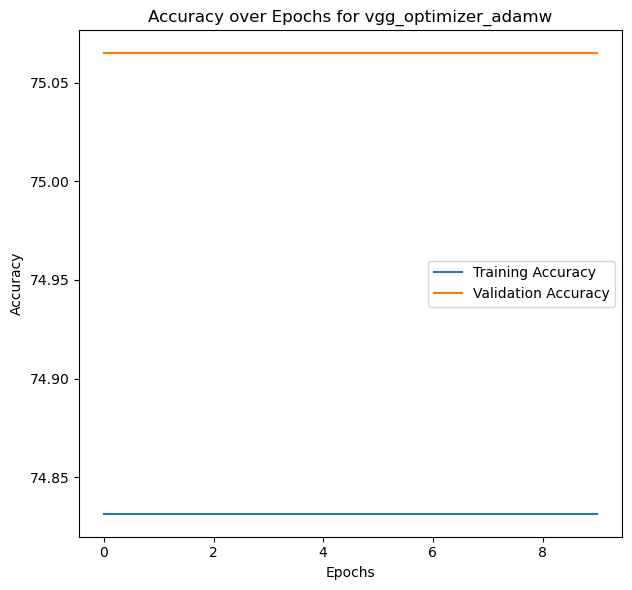

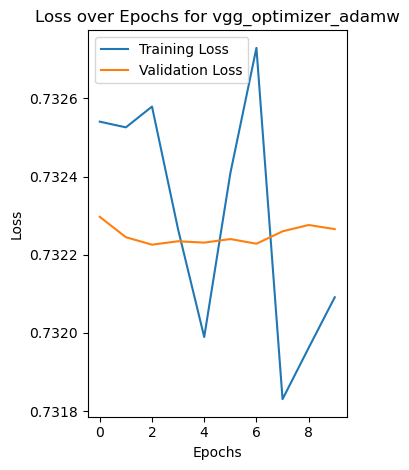

<Figure size 640x480 with 0 Axes>

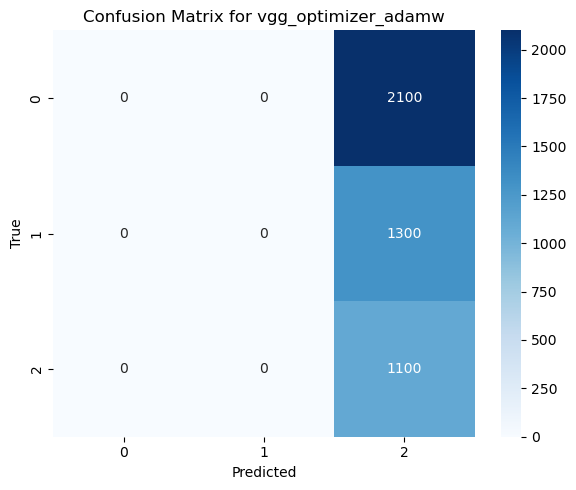

<Figure size 640x480 with 0 Axes>

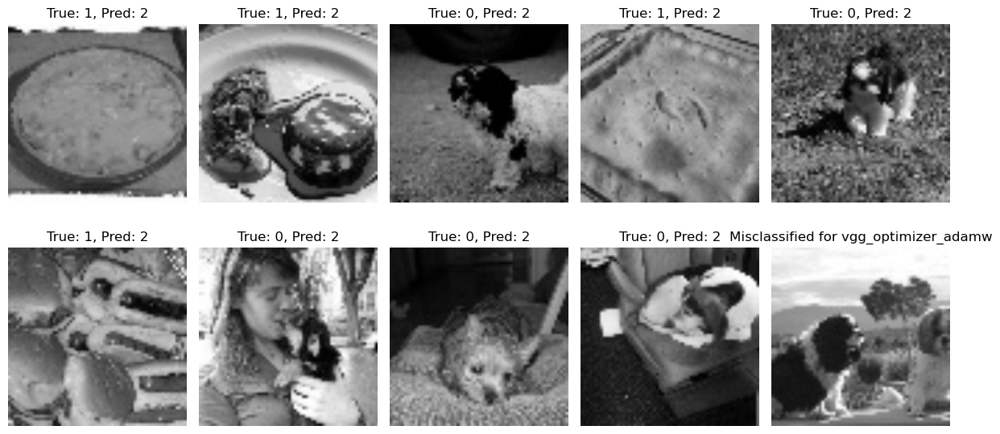


Experimenting with: Batch Size = 32
Iteration 1/10: Train Loss: 0.7323, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 2/10: Train Loss: 0.7324, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 3/10: Train Loss: 0.7325, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 4/10: Train Loss: 0.7320, Train Accuracy: 74.8315%, Val Loss: 0.7323, Val Accuracy: 75.0649%
Iteration 5/10: Train Loss: 0.7322, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 6/10: Train Loss: 0.7318, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 7/10: Train Loss: 0.7322, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 8/10: Train Loss: 0.7319, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 9/10: Train Loss: 0.7317, Train Accuracy: 74.8315%, Val Loss: 0.7322, Val Accuracy: 75.0649%
Iteration 10/10: Train Loss: 0.7312,

<Figure size 640x480 with 0 Axes>

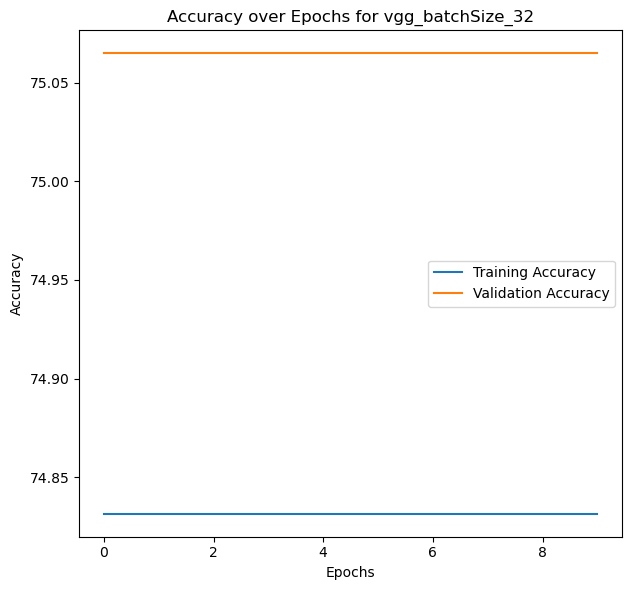

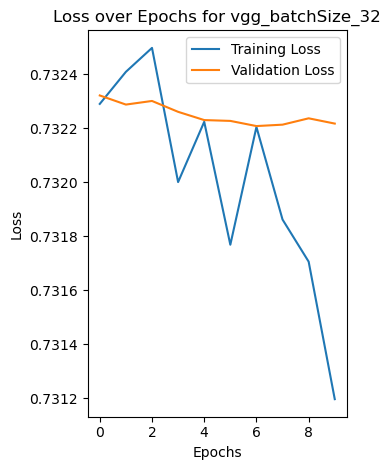

<Figure size 640x480 with 0 Axes>

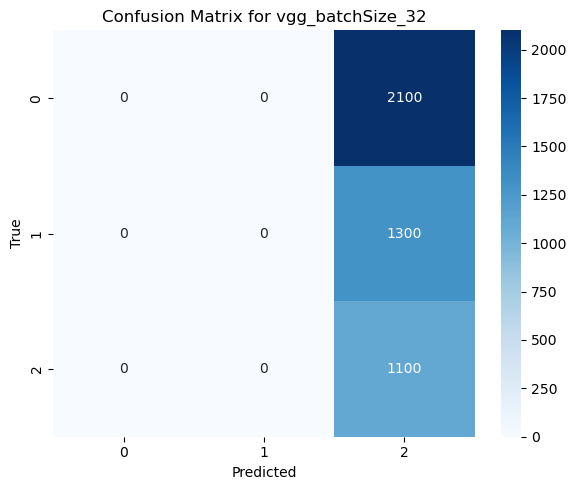

<Figure size 640x480 with 0 Axes>

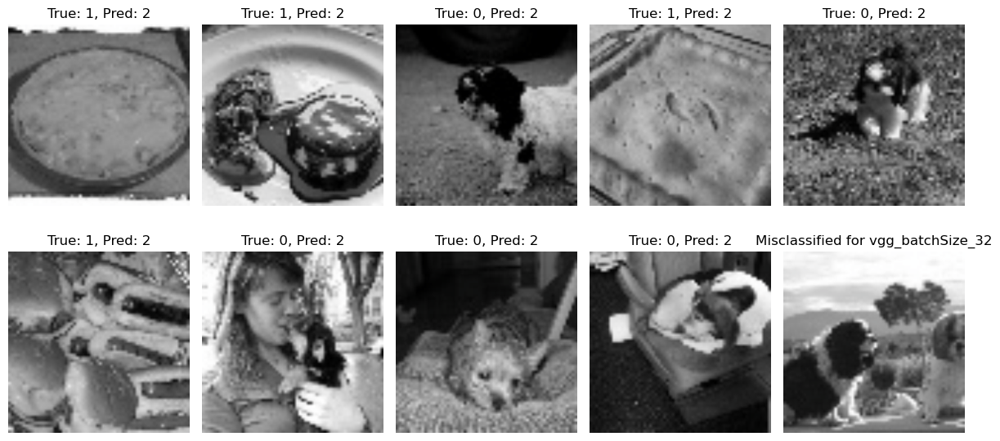


Experimenting with: Batch Size = 64
Iteration 1/10: Train Loss: 0.7320, Train Accuracy: 74.8315%, Val Loss: 0.7333, Val Accuracy: 75.0649%
Iteration 2/10: Train Loss: 0.7320, Train Accuracy: 74.8315%, Val Loss: 0.7333, Val Accuracy: 75.0649%
Iteration 3/10: Train Loss: 0.7321, Train Accuracy: 74.8315%, Val Loss: 0.7333, Val Accuracy: 75.0649%
Iteration 4/10: Train Loss: 0.7323, Train Accuracy: 74.8315%, Val Loss: 0.7333, Val Accuracy: 75.0649%
Iteration 5/10: Train Loss: 0.7320, Train Accuracy: 74.8315%, Val Loss: 0.7333, Val Accuracy: 75.0649%
Iteration 6/10: Train Loss: 0.7323, Train Accuracy: 74.8315%, Val Loss: 0.7334, Val Accuracy: 75.0649%
Iteration 7/10: Train Loss: 0.7318, Train Accuracy: 74.8315%, Val Loss: 0.7334, Val Accuracy: 75.0649%
Iteration 8/10: Train Loss: 0.7325, Train Accuracy: 74.8315%, Val Loss: 0.7334, Val Accuracy: 75.0649%
Iteration 9/10: Train Loss: 0.7323, Train Accuracy: 74.8315%, Val Loss: 0.7334, Val Accuracy: 75.0649%
Iteration 10/10: Train Loss: 0.7322,

<Figure size 640x480 with 0 Axes>

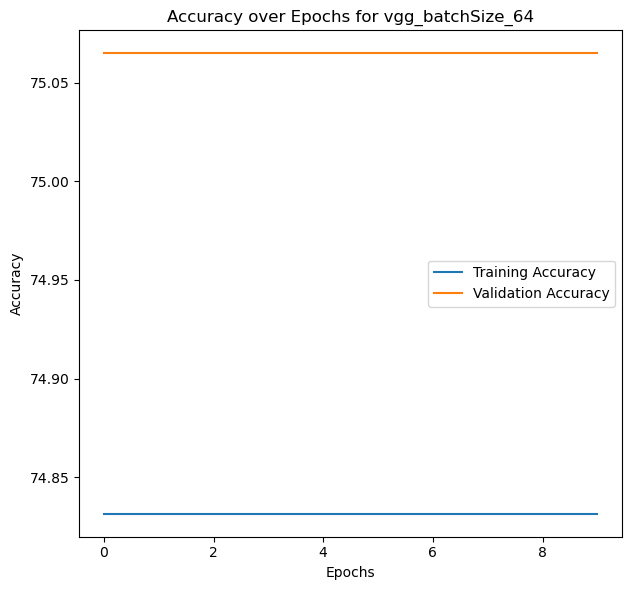

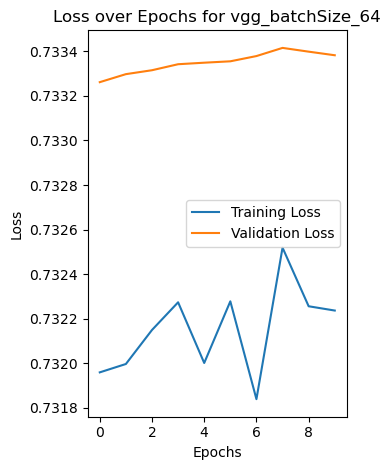

<Figure size 640x480 with 0 Axes>

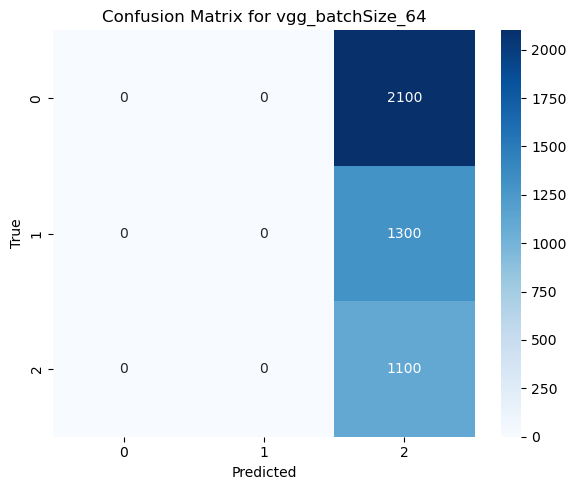

<Figure size 640x480 with 0 Axes>

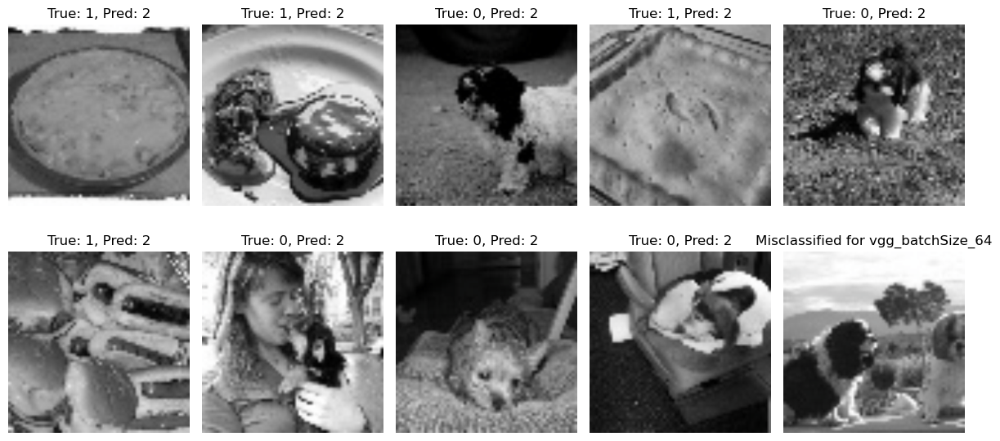


Experimenting with: Weight Type = xavier
Iteration 1/10: Train Loss: 0.7329, Train Accuracy: 72.5843%, Val Loss: 0.7273, Val Accuracy: 75.0649%
Iteration 2/10: Train Loss: 0.7145, Train Accuracy: 76.5169%, Val Loss: 0.6973, Val Accuracy: 81.5584%
Iteration 3/10: Train Loss: 0.6764, Train Accuracy: 86.0674%, Val Loss: 0.6785, Val Accuracy: 80.2597%
Iteration 4/10: Train Loss: 0.6770, Train Accuracy: 86.0000%, Val Loss: 0.7056, Val Accuracy: 88.0519%
Iteration 5/10: Train Loss: 0.6554, Train Accuracy: 87.0000%, Val Loss: 0.7013, Val Accuracy: 85.4545%
Iteration 6/10: Train Loss: 0.6172, Train Accuracy: 87.0000%, Val Loss: 0.7134, Val Accuracy: 88.8200%
Iteration 7/10: Train Loss: 0.5696, Train Accuracy: 86.0000%, Val Loss: 0.6559, Val Accuracy: 85.6200%
Iteration 8/10: Train Loss: 0.5245, Train Accuracy: 87.0000%, Val Loss: 0.6482, Val Accuracy: 85.7600%
Iteration 9/10: Train Loss: 0.5699, Train Accuracy: 80.0000%, Val Loss: 0.7026, Val Accuracy: 88.7400%
Iteration 10/10: Train Loss: 0.

<Figure size 640x480 with 0 Axes>

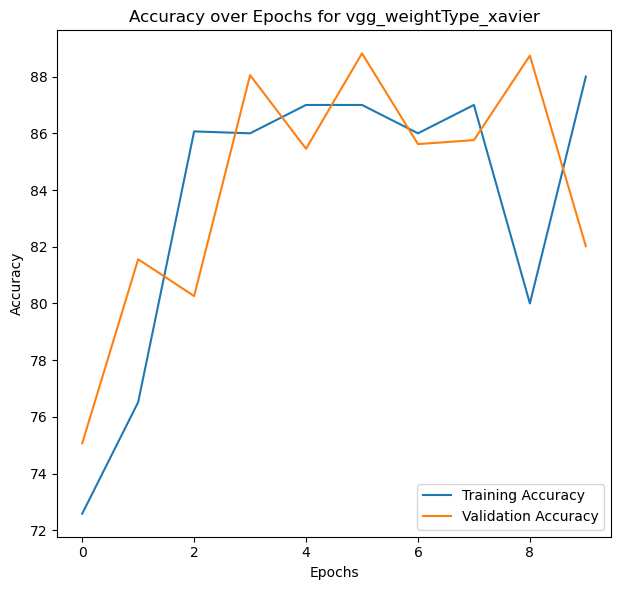

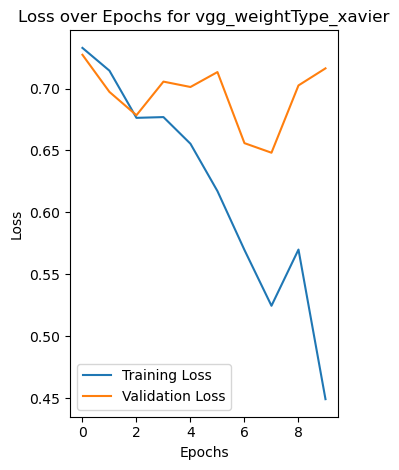

<Figure size 640x480 with 0 Axes>

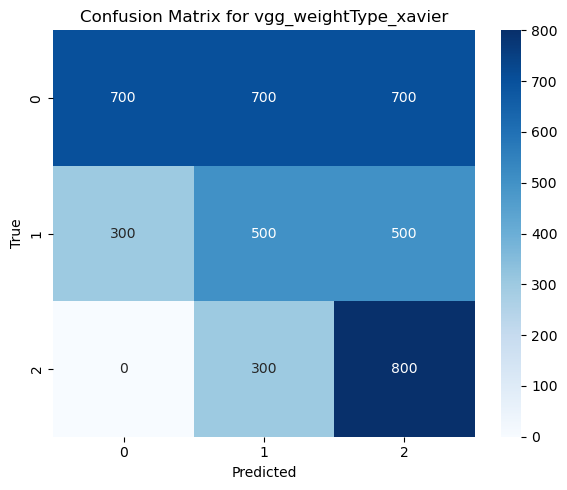

<Figure size 640x480 with 0 Axes>

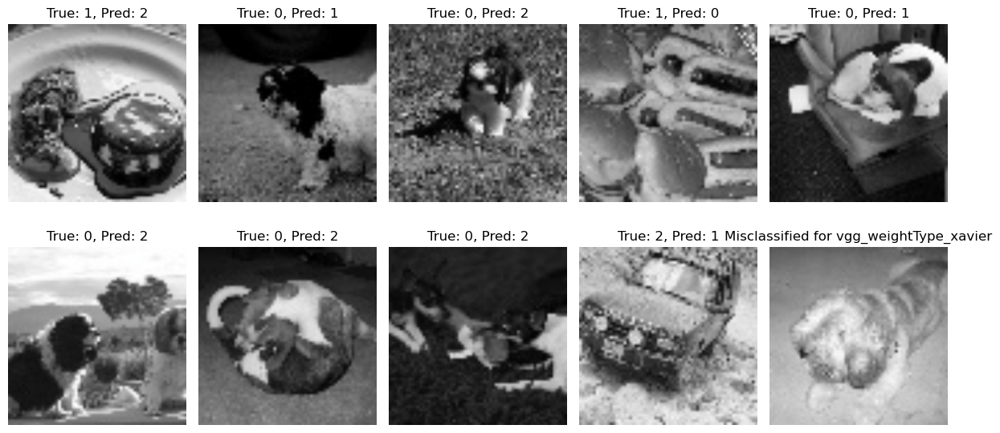


Experimenting with: Weight Type = he
Iteration 1/10: Train Loss: 35.2145, Train Accuracy: 70.8989%, Val Loss: 2.8039, Val Accuracy: 76.3636%
Iteration 2/10: Train Loss: 1.8652, Train Accuracy: 73.1461%, Val Loss: 0.7789, Val Accuracy: 73.7662%
Iteration 3/10: Train Loss: 0.7953, Train Accuracy: 85.5056%, Val Loss: 0.8100, Val Accuracy: 76.3636%
Iteration 4/10: Train Loss: 0.7340, Train Accuracy: 82.6966%, Val Loss: 0.7118, Val Accuracy: 71.1688%
Iteration 5/10: Train Loss: 0.6802, Train Accuracy: 82.0000%, Val Loss: 0.6622, Val Accuracy: 82.4600%
Iteration 6/10: Train Loss: 0.6220, Train Accuracy: 90.0000%, Val Loss: 0.6068, Val Accuracy: 84.0000%
Iteration 7/10: Train Loss: 0.5647, Train Accuracy: 84.0000%, Val Loss: 0.6365, Val Accuracy: 89.2900%
Iteration 8/10: Train Loss: 0.5752, Train Accuracy: 87.0000%, Val Loss: 0.7344, Val Accuracy: 81.5584%
Iteration 9/10: Train Loss: 0.6066, Train Accuracy: 88.0000%, Val Loss: 0.5987, Val Accuracy: 88.2400%
Iteration 10/10: Train Loss: 0.488

<Figure size 640x480 with 0 Axes>

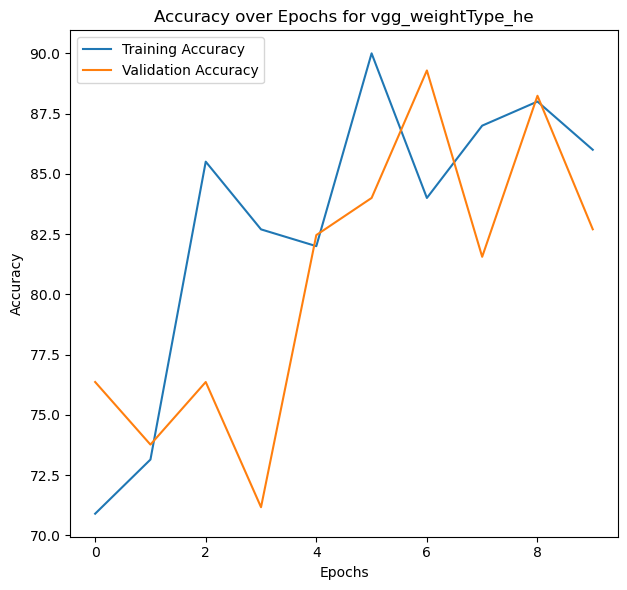

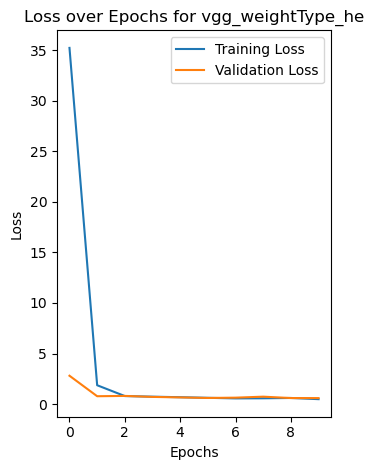

<Figure size 640x480 with 0 Axes>

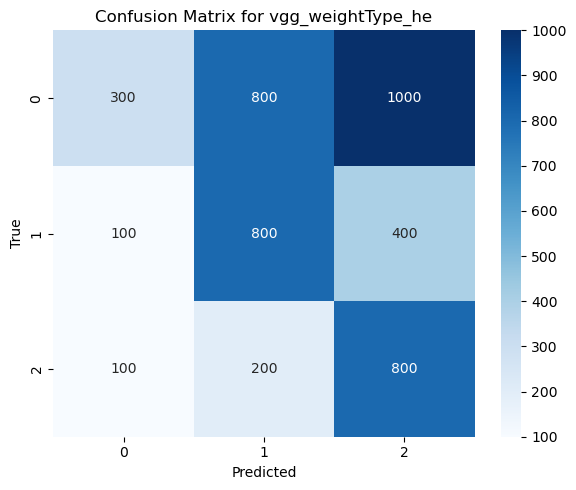

<Figure size 640x480 with 0 Axes>

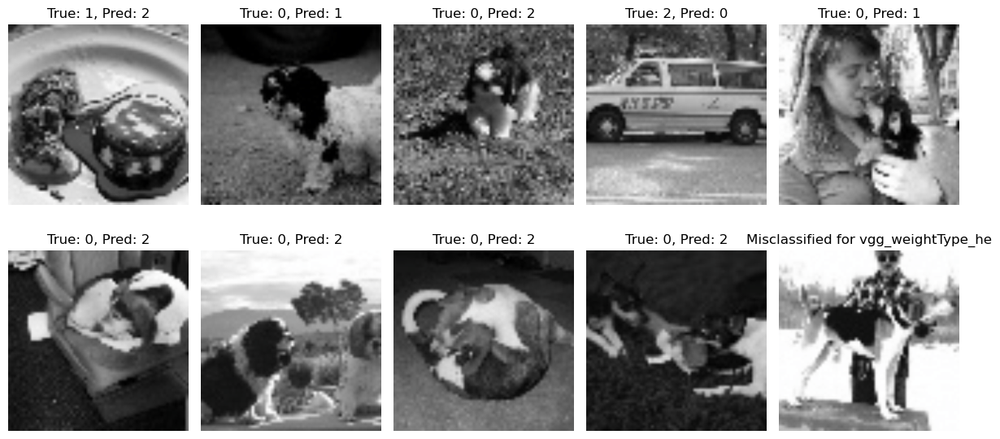

<Figure size 640x480 with 0 Axes>

In [ ]:

# Initialize TensorBoard writer
writer = SummaryWriter()
    

# Early Stopping Class
class EarlyStopping:
    def __init__(self, minDelta=0.001, patience=3):
        self.patience = patience
        self.minDelta = minDelta
        self.bestLoss = float('inf')
        self.counter = 0

    def __call__(self, valLoss):
        if valLoss < self.bestLoss - self.minDelta:
            self.bestLoss = valLoss
            self.counter = 0
        else:
            self.counter += 1
        return self.counter >= self.patience

# Function to train the model
def trainVGGModel(model, trainLoader, valLoader, optimizer, criterion, device, iterations, earlyStopping=None):
    bestAccuracy = 0.0
    bestModel = None
    valLosses, trainLosses = [], []
    trainAccuracies, valAccuracies = [], []
    
    for iteration in range(iterations):
        model.train()
        runningLoss, correctTrain, totalTrain = 0.0, 0, 0
        
        for inputs, labels in trainLoader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels) # loss
            loss.backward()
            optimizer.step()
            
            _, predicted = torch.max(outputs, 1)
            totalTrain = totalTrain + labels.size(0)
            runningLoss = runningLoss + loss.item()
            correctTrain = correctTrain + (predicted == labels).sum().item()

        trainLoss = runningLoss / len(trainLoader)
        trainAccuracy = (correctTrain / totalTrain) * 100

        trainLosses.append(trainLoss)
        trainAccuracies.append(trainAccuracy)

        # Validation
        model.eval()
        correctVal, totalVal, valLoss = 0, 0, 0.0
        with torch.no_grad():
            for inputs, labels in valLoader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                _, predicted = torch.max(outputs, 1)
                totalVal = totalVal + labels.size(0)
                valLoss = valLoss + loss.item()
                correctVal = correctVal + (predicted == labels).sum().item()

        valLoss /= len(valLoader)
        valAccuracy =  (correctVal / totalVal) * 100 if totalVal > 0 else 0.0

        valLosses.append(valLoss)
        valAccuracies.append(valAccuracy)
        print(f'Iteration {iteration+1}/{iterations}: Train Loss: {trainLoss:.4f}, Train Accuracy: {trainAccuracy:.4f}%, Val Loss: {valLoss:.4f}, Val Accuracy: {valAccuracy:.4f}%')

        # Early Stopping Check
        if earlyStopping and earlyStopping(valLoss):
            print("Early stopping triggered")
            break

        if valAccuracy > bestAccuracy:
            bestAccuracy = valAccuracy
            bestModel = model

    return bestModel, bestAccuracy, trainAccuracies, valAccuracies, trainLosses, valLosses


# Evaluate model after training
def evaluateVGGModel(model, testLoader, device, criterion, numMisclassified=10):
    model.eval()
    correctTest = 0
    totalTest = 0
    testLoss = 0.0
    testPredictions = []
    testLabels = []
    misclassifiedSamples = []

    with torch.no_grad():
        for inputs, labels in testLoader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            _, predicted = torch.max(outputs, 1)
            totalTest = totalTest + labels.size(0)
            correctTest = correctTest + (predicted == labels).sum().item()
            testLoss = testLoss + loss.item()

            testLabels.extend(labels.cpu().numpy())
            testPredictions.extend(predicted.cpu().numpy()) # predictions
            for i in range(len(labels)):
                if labels[i] != predicted[i] and len(misclassifiedSamples) < numMisclassified:
                    misclassifiedSamples.append((inputs[i].cpu(), labels[i].item(), predicted[i].item()))

    testAccuracy = (correctTest / totalTest) * 100
    testLoss = testLoss / len(testLoader)

    print(f'Test Accuracy: {testAccuracy:.4f}, Test Loss: {testLoss:.4f}')

    # Precision, Recall, F1 Score
    precision, recall, f1, _ = precision_recall_fscore_support(testLabels, testPredictions, average='macro', zero_division=1)

    print(f'Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}')
    return testAccuracy, testLoss, testPredictions, testLabels, precision, recall, f1, misclassifiedSamples


# Function to plot metrics for each experiment
def plotMetrics(trainAccuracies, valAccuracies, trainLosses, valLosses, testLabels, testPredictions, misclassifiedSamples, title):
    plot.figure(figsize=(12, 6))

    # Accuracy Plot
    plot.subplot(1, 2, 1)
    plot.plot(trainAccuracies, label='Training Accuracy')
    plot.plot(valAccuracies, label='Validation Accuracy')
    plot.title(f"Accuracy over Epochs for {title}")
    plot.xlabel('Epochs')
    plot.ylabel('Accuracy')
    plot.legend()
    name = 'accuracyFor'+title
    plot.tight_layout()

    plot.savefig(name+'.svg', format='svg')
    plot.show()
    writer.add_figure(name, plot.gcf(), global_step=0)
    writer.flush()
    plot.clf()


    # Loss Plot
    plot.subplot(1, 2, 2)
    plot.plot(trainLosses, label='Training Loss')
    plot.plot(valLosses, label='Validation Loss')
    plot.xlabel('Epochs')
    plot.ylabel('Loss')
    plot.title(f"Loss over Epochs for {title}")
    plot.legend()
    name = 'lossFor'+title
    plot.tight_layout()
    plot.savefig(name+'.svg', format='svg')
    plot.show()
    writer.add_figure(name, plot.gcf(), global_step=0)
    writer.flush()
    plot.clf()


    # Confusion Matrix Plot
    confusionMatrix = confusion_matrix(testLabels, testPredictions)
    plot.figure(figsize=(6, 5))
    seaborn.heatmap(confusionMatrix, annot=True, fmt='d', cmap='Blues', xticklabels=numpy.arange(len(confusionMatrix)), yticklabels=numpy.arange(len(confusionMatrix)))
    plot.xlabel("Predicted")
    plot.ylabel("True")
    plot.title(f"Confusion Matrix for {title}")
    name = 'confusionMatrixFor'+title
    plot.tight_layout()
    plot.savefig(name+'.svg', format='svg')
    plot.show()
    writer.add_figure(name, plot.gcf(), global_step=0)
    writer.flush()
    plot.clf()


    # Misclassified
    if len(misclassifiedSamples) == 0:
        print("No misclassified images to display.")
        return

    fig, axes = plot.subplots(2, 5, figsize=(12, 6))  # Show up to 10 images
    axes = axes.flatten()

    for i, (image, true_label, predicted_label) in enumerate(misclassifiedSamples):
        image = image.permute(1, 2, 0).numpy()  # Convert to HWC format
        mean = numpy.array([0.485, 0.456, 0.406])
        std = numpy.array([0.229, 0.224, 0.225])
        image = image * std + mean  # Denormalize
        image = numpy.clip(image, 0, 1)  # Clip values

        axes[i].imshow(image)
        axes[i].set_title(f"True: {true_label}, Pred: {predicted_label}")
        axes[i].axis('off')

    plot.tight_layout()
    plot.title(f"Misclassified for {title}")
    name = 'MisclassifiedFor'+title
    plot.savefig(name+'.svg', format='svg')
    plot.show()
    writer.add_figure(name, plot.gcf(), global_step=0)
    writer.flush()
    plot.clf()



def modelWithOptimizer(model, optimizerName, learningRate=0.0001, weightDecay=1e-4):
    if optimizerName == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=learningRate, weight_decay=weightDecay)
    elif optimizerName == 'sgd':
        optimizer = torch.optim.SGD(model.parameters(), lr=learningRate, momentum=0.9, weight_decay=weightDecay)
    elif optimizerName == 'adamw':
        optimizer = torch.optim.AdamW(model.parameters(), lr=learningRate, weight_decay=weightDecay)
    return optimizer

def modelWithBatchSize(batchSize):
    trainLoader = DataLoader(trainDataset, batch_size=batchSize, shuffle=True)
    valLoader = DataLoader(valDataset, batch_size=batchSize, shuffle=False)
    return trainLoader, valLoader

def modelWithWeightType(model, weightType):
    if weightType == 'xavier':
        initializeWeights(model, weightType)
    elif weightType == 'he':
        initializeWeights(model, weightType)
    return model

def modelWithTechnique(model, technique):
    if technique == 'batchNorm':
        model.batchNorm = True
    elif technique == 'dropout':
        model.dropout = torch.nn.Dropout(p=0.3)
    elif technique == 'earlystopping':
        model.earlyStopping = EarlyStopping(patience=10)
    return model



# Starting the experiments
optimizers = ['adam', 'sgd', 'adamw']
batchSizes = [32, 64]
initializations = ['xavier', 'he']
techniques = ['earlystopping', 'batchNorm', 'dropout']
bestVGGModelAfterAllExperiments = None
bestVGGAccuracyAfterAllExperiments = 0
bestVGGTrainingAccuracies = []
bestVGGTrainingLosses = []
bestVGGValidationAccuracies = []
bestVGGValidationLosses = []

allPredictions = []
allLabels = []

iterations = 10

# Optimizer
bestVGGOptimizer = 'adam'

# Loop through optimizers
for optimizerName in optimizers:
    print(f"\nExperimenting with: Optimizer = {optimizerName}")

    # Update the optimizer
    optimizer = modelWithOptimizer(model, optimizerName)
    
    bestModel, bestAccuracy, trainAccuracies, valAccuracies, trainLosses, valLosses = trainVGGModel(model, trainLoader, valLoader, optimizer, criterion, device, iterations)

    testAccuracy, testLoss, testPredictions, testLabels, precision, recall, f1, misclassifiedSamples = evaluateVGGModel(bestModel, testLoader, device, criterion, numMisclassified=10)
    
    if testAccuracy > bestVGGAccuracyAfterAllExperiments:
        bestVGGAccuracyAfterAllExperiments = testAccuracy
        bestVGGModelAfterAllExperiments = bestModel
        bestVGGTrainingAccuracies = trainAccuracies
        bestVGGTrainingLosses = trainLosses
        bestVGGValidationAccuracies = valAccuracies
        bestVGGValidationLosses = valLosses
        bestVGGOptimizer = optimizerName

    # Plot metrics for the experiment
    plotMetrics(trainAccuracies, valAccuracies, trainLosses, valLosses, testLabels, testPredictions, misclassifiedSamples, f'vgg_optimizer_{optimizerName}')


# Batch Size
bestVGGBatchSize = 32

optimizer = modelWithOptimizer(model, bestVGGOptimizer)

# Loop through batch sizes
for batchSize in batchSizes:
    print(f"\nExperimenting with: Batch Size = {batchSize}")

    trainLoader, valLoader = modelWithBatchSize(batchSize)

    bestModel, bestAccuracy, trainAccuracies, valAccuracies, trainLosses, valLosses = trainVGGModel(model, trainLoader, valLoader, optimizer, criterion, device, iterations)

    testAccuracy, testLoss, testPredictions, testLabels, precision, recall, f1, misclassifiedSamples = evaluateVGGModel(bestModel, testLoader, device, criterion, numMisclassified=10)
    
    if bestAccuracy > bestVGGAccuracyAfterAllExperiments:
        bestVGGAccuracyAfterAllExperiments = bestAccuracy
        bestVGGModelAfterAllExperiments = bestModel
        bestVGGTrainingAccuracies = trainAccuracies
        bestVGGTrainingLosses = trainLosses
        bestVGGValidationAccuracies = valAccuracies
        bestVGGValidationLosses = valLosses
        bestVGGBatchSize = batchSize
        

    # Plot metrics for the experiment
    plotMetrics(trainAccuracies, valAccuracies, trainLosses, valLosses, testLabels, testPredictions, misclassifiedSamples, f'vgg_batchSize_{batchSize}')


# Initialization Weights
bestVGGWeightType = 'xavier'

optimizer = modelWithOptimizer(model, bestVGGOptimizer)
trainLoader, valLoader = modelWithBatchSize(bestVGGBatchSize)

for weightType in initializations:
    print(f"\nExperimenting with: Weight Type = {weightType}")

    bestModel, bestAccuracy, trainAccuracies, valAccuracies, trainLosses, valLosses = trainVGGModel(modelWithWeightType(model, weightType), trainLoader, valLoader, optimizer, criterion, device, iterations)

    testAccuracy, testLoss, testPredictions, testLabels, precision, recall, f1, misclassifiedSamples = evaluateVGGModel(bestModel, testLoader, device, criterion, numMisclassified=10)
    
    if bestAccuracy > bestVGGAccuracyAfterAllExperiments:
        bestVGGAccuracyAfterAllExperiments = bestAccuracy
        bestVGGModelAfterAllExperiments = bestModel
        bestVGGTrainingAccuracies = trainAccuracies
        bestVGGTrainingLosses = trainLosses
        bestVGGValidationAccuracies = valAccuracies
        bestVGGValidationLosses = valLosses
        bestVGGWeightType = weightType
       

    # Plot metrics for the experiment
    plotMetrics(trainAccuracies, valAccuracies, trainLosses, valLosses, testLabels, testPredictions, misclassifiedSamples, f'vgg_weightType_{weightType}')


Experimenting with: Performance Techniques = earlystopping
Iteration 1/10: Train Loss: 32.8435, Train Accuracy: 64.7191%, Val Loss: 2.0780, Val Accuracy: 78.9610%
Iteration 2/10: Train Loss: 1.9322, Train Accuracy: 74.8315%, Val Loss: 1.0455, Val Accuracy: 77.6623%
Iteration 3/10: Train Loss: 0.9872, Train Accuracy: 83.0000%, Val Loss: 0.8900, Val Accuracy: 81.0100%
Iteration 4/10: Train Loss: 0.7891, Train Accuracy: 83.8202%, Val Loss: 0.7629, Val Accuracy: 78.9610%
Iteration 5/10: Train Loss: 0.7041, Train Accuracy: 83.0000%, Val Loss: 0.7009, Val Accuracy: 80.0600%
Iteration 6/10: Train Loss: 0.6566, Train Accuracy: 87.7528%, Val Loss: 0.6402, Val Accuracy: 87.2600%
Iteration 7/10: Train Loss: 0.5443, Train Accuracy: 80.0000%, Val Loss: 0.6085, Val Accuracy: 85.5400%
Iteration 8/10: Train Loss: 0.5067, Train Accuracy: 83.0000%, Val Loss: 0.6098, Val Accuracy: 81.6500%
Iteration 9/10: Train Loss: 0.5045, Train Accuracy: 80.0000%, Val Loss: 0.5938, Val Accuracy: 83.4700%
Iteration 10

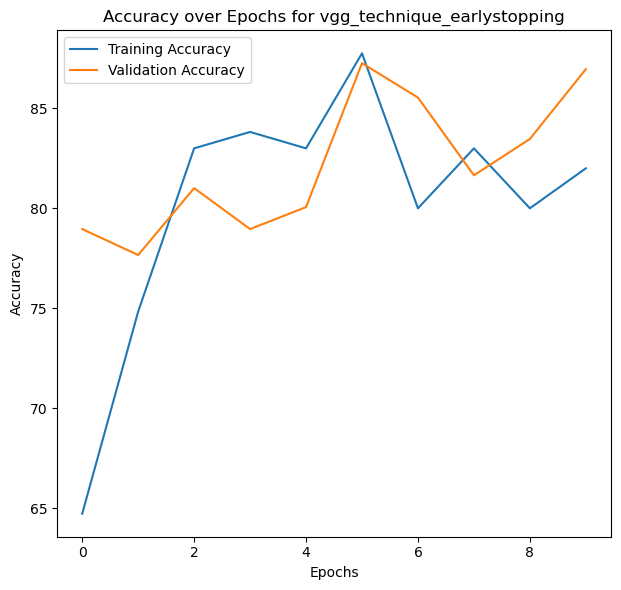

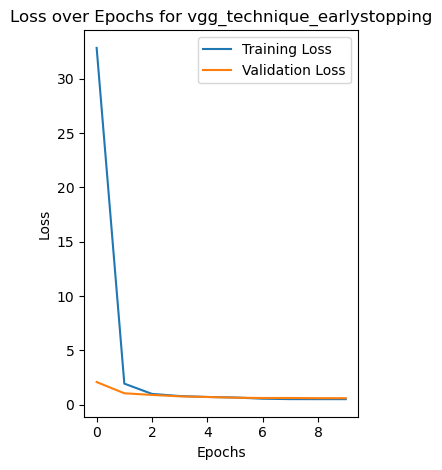

<Figure size 640x480 with 0 Axes>

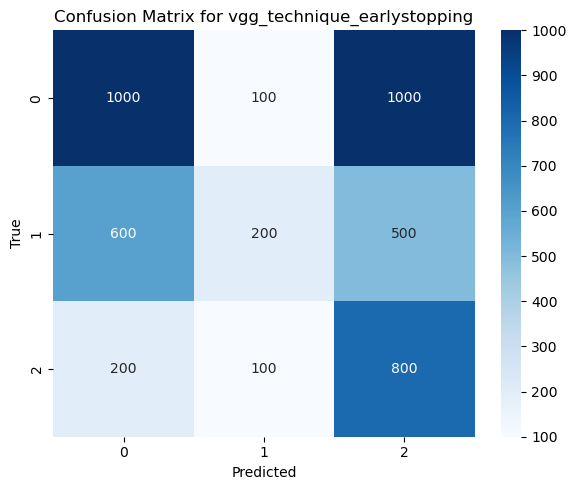

<Figure size 640x480 with 0 Axes>

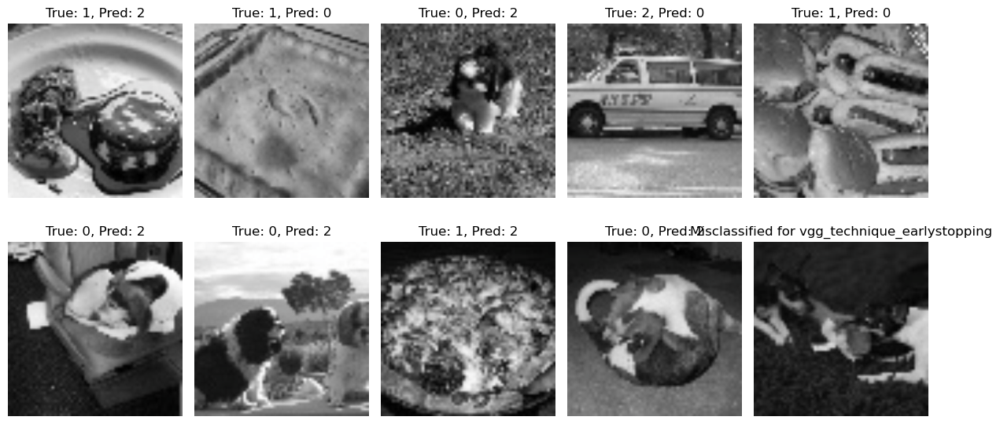


Experimenting with: Performance Techniques = batchNorm
Iteration 1/10: Train Loss: 0.4867, Train Accuracy: 83.0000%, Val Loss: 0.6194, Val Accuracy: 84.7000%
Iteration 2/10: Train Loss: 0.4228, Train Accuracy: 86.0000%, Val Loss: 0.6339, Val Accuracy: 84.8900%
Iteration 3/10: Train Loss: 0.3944, Train Accuracy: 86.0000%, Val Loss: 0.6369, Val Accuracy: 86.6500%
Iteration 4/10: Train Loss: 0.3475, Train Accuracy: 89.0000%, Val Loss: 0.6915, Val Accuracy: 81.4300%
Iteration 5/10: Train Loss: 0.4148, Train Accuracy: 83.1461%, Val Loss: 0.6537, Val Accuracy: 83.8100%
Iteration 6/10: Train Loss: 0.3309, Train Accuracy: 89.8876%, Val Loss: 0.7031, Val Accuracy: 81.0300%
Iteration 7/10: Train Loss: 0.2528, Train Accuracy: 93.2584%, Val Loss: 0.7038, Val Accuracy: 81.9600%
Iteration 8/10: Train Loss: 0.1889, Train Accuracy: 93.2584%, Val Loss: 0.8034, Val Accuracy: 81.7400%
Iteration 9/10: Train Loss: 0.1335, Train Accuracy: 97.1910%, Val Loss: 1.0086, Val Accuracy: 87.8600%
Iteration 10/10: 

<Figure size 640x480 with 0 Axes>

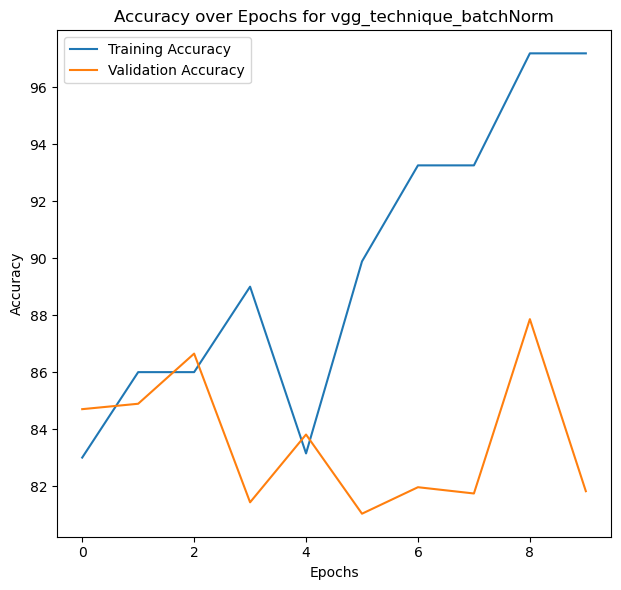

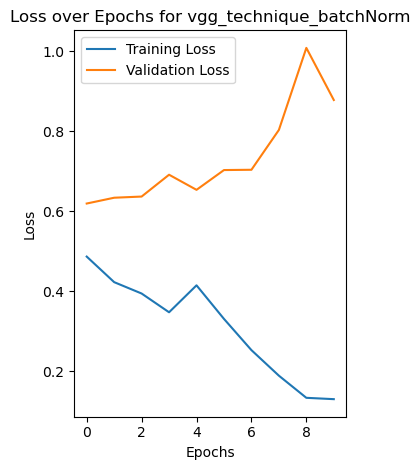

<Figure size 640x480 with 0 Axes>

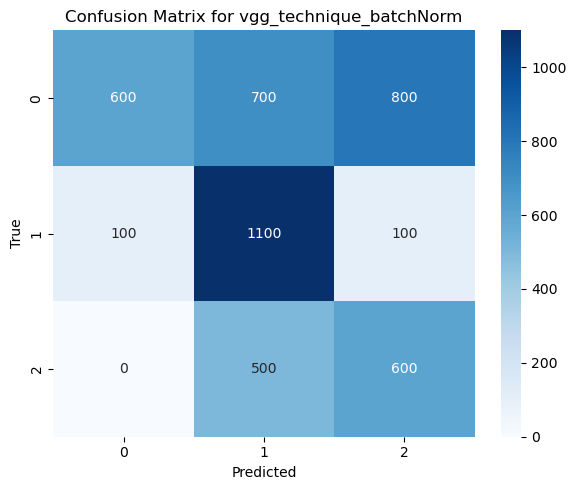

<Figure size 640x480 with 0 Axes>

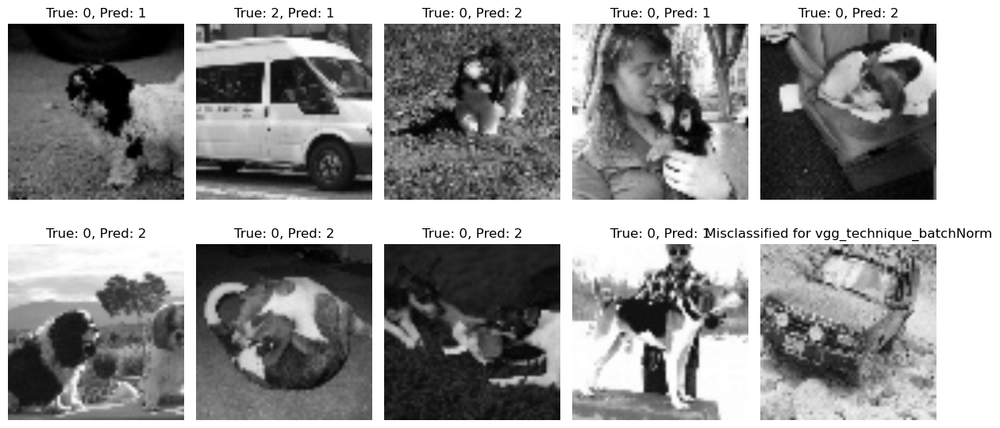


Experimenting with: Performance Techniques = dropout
Iteration 1/10: Train Loss: 0.0890, Train Accuracy: 98.3146%, Val Loss: 1.0225, Val Accuracy: 80.1000%
Iteration 2/10: Train Loss: 0.0538, Train Accuracy: 98.8764%, Val Loss: 0.8865, Val Accuracy: 81.3300%
Iteration 3/10: Train Loss: 0.0632, Train Accuracy: 98.3146%, Val Loss: 0.9923, Val Accuracy: 82.9500%
Iteration 4/10: Train Loss: 0.0701, Train Accuracy: 97.1910%, Val Loss: 1.0167, Val Accuracy: 85.9100%
Iteration 5/10: Train Loss: 0.0704, Train Accuracy: 98.3146%, Val Loss: 1.1483, Val Accuracy: 84.0600%
Iteration 6/10: Train Loss: 0.0496, Train Accuracy: 98.3146%, Val Loss: 1.1023, Val Accuracy: 84.9600%
Iteration 7/10: Train Loss: 0.0459, Train Accuracy: 98.8764%, Val Loss: 1.1558, Val Accuracy: 84.1400%
Iteration 8/10: Train Loss: 0.0311, Train Accuracy: 99.4382%, Val Loss: 1.1292, Val Accuracy: 81.2600%
Iteration 9/10: Train Loss: 0.0352, Train Accuracy: 99.4382%, Val Loss: 1.2873, Val Accuracy: 89.4000%
Iteration 10/10: Tr

<Figure size 640x480 with 0 Axes>

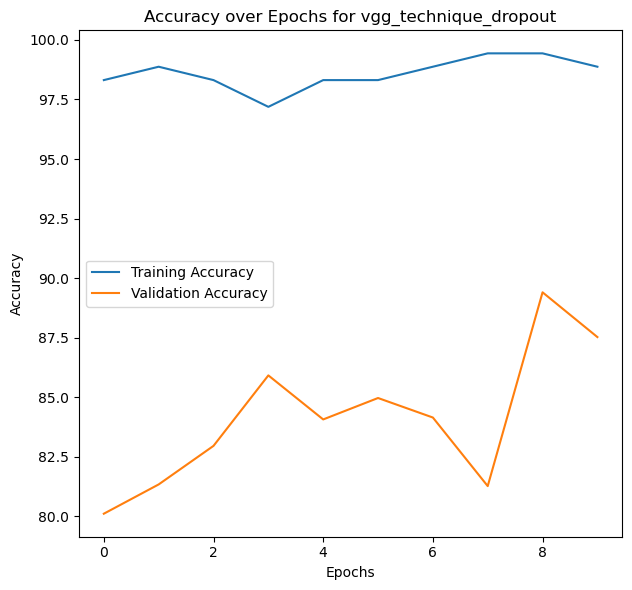

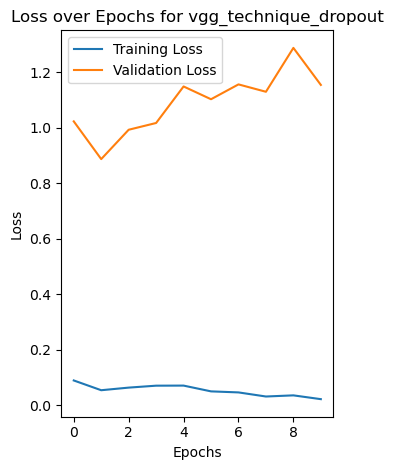

<Figure size 640x480 with 0 Axes>

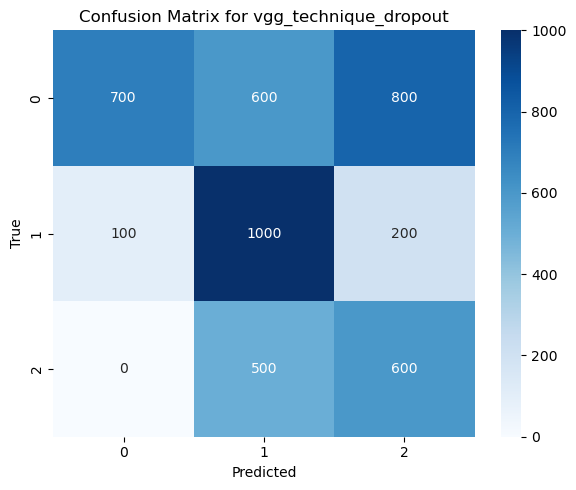

<Figure size 640x480 with 0 Axes>

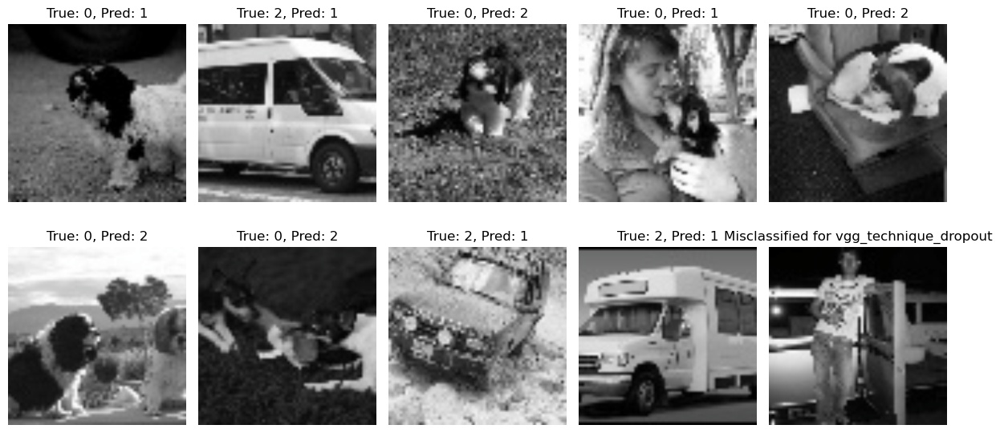

<Figure size 640x480 with 0 Axes>

In [54]:
# Techniques
bestVGGTechnique = None

optimizer = modelWithOptimizer(model, bestVGGOptimizer)
trainLoader, valLoader = modelWithBatchSize(bestVGGBatchSize)
model = modelWithWeightType(model, bestVGGWeightType)


for technique in techniques:
    print(f"\nExperimenting with: Performance Techniques = {technique}")

    earlyStopping = EarlyStopping(patience=10) if technique == 'earlystopping' else None

    bestModel, bestAccuracy, trainAccuracies, valAccuracies, trainLosses, valLosses = trainVGGModel(modelWithTechnique(model, technique), trainLoader, valLoader, optimizer, criterion, device, iterations, earlyStopping = earlyStopping)

    testAccuracy, testLoss, testPredictions, testLabels, precision, recall, f1, misclassifiedSamples = evaluateVGGModel(bestModel, testLoader, device, criterion, numMisclassified=10)
    
    if bestAccuracy > bestVGGAccuracyAfterAllExperiments:
        bestVGGAccuracyAfterAllExperiments = bestAccuracy
        bestVGGModelAfterAllExperiments = bestModel
        bestVGGTrainingAccuracies = trainAccuracies
        bestVGGTrainingLosses = trainLosses
        bestVGGValidationAccuracies = valAccuracies
        bestVGGValidationLosses = valLosses
        bestVGGTechnique = technique
       

    # Plot metrics for the experiment
    plotMetrics(trainAccuracies, valAccuracies, trainLosses, valLosses, testLabels, testPredictions, misclassifiedSamples, f'vgg_technique_{technique}')

<u>a.Training accuracy, training loss, validation accuracy, validation loss, testing
accuracy, and testing loss.</u><br><br><br>

The best performance was achieved with a plain  VGG network using <br> 
**Xavier initialization**, **Adam optimizer**, **Dropout of 0.3** and a **batch size of 32**. <br>
Despite experimenting with dropout changes, batch normalization, and early stopping, these techniques didn’t improve the model’s performance much.<br>
Simpler configurations yielded better results in this case.<br>
The training loss , training accuracy , validation loss , validation accuracy are provided below.

Experimenting with: Performance Techniques = dropout <br>
Iteration 1/10: Train Loss: 0.0890, Train Accuracy: 98.3146%, Val Loss: 1.0225, Val Accuracy: 80.1000% <br>
Iteration 2/10: Train Loss: 0.0538, Train Accuracy: 98.8764%, Val Loss: 0.8865, Val Accuracy: 81.3300% <br>
Iteration 3/10: Train Loss: 0.0632, Train Accuracy: 98.3146%, Val Loss: 0.9923, Val Accuracy: 82.9500% <br>
Iteration 4/10: Train Loss: 0.0701, Train Accuracy: 97.1910%, Val Loss: 1.0167, Val Accuracy: 85.9100% <br>
Iteration 5/10: Train Loss: 0.0704, Train Accuracy: 98.3146%, Val Loss: 1.1483, Val Accuracy: 84.0600% <br>
Iteration 6/10: Train Loss: 0.0496, Train Accuracy: 98.3146%, Val Loss: 1.1023, Val Accuracy: 84.9600% <br>
Iteration 7/10: Train Loss: 0.0459, Train Accuracy: 98.8764%, Val Loss: 1.1558, Val Accuracy: 84.1400% <br>
Iteration 8/10: Train Loss: 0.0311, Train Accuracy: 99.4382%, Val Loss: 1.1292, Val Accuracy: 81.2600% <br>
Iteration 9/10: Train Loss: 0.0352, Train Accuracy: 99.4382%, Val Loss: 1.2873, Val Accuracy: 89.4000% <br>
Iteration 10/10: Train Loss: 0.0216, Train Accuracy: 98.8764%, Val Loss: 1.1538, Val Accuracy: 87.5200% <br>
Test Accuracy: 84.0600, Test Loss: 1.8486 <br>
Precision: 0.6905, Recall: 0.6700, F1 Score: 0.6801 <br>
Best accuracy for VGG 16 model:  89.4 <br>

<u>b.training and validation accuracy over time (epochs).</u>

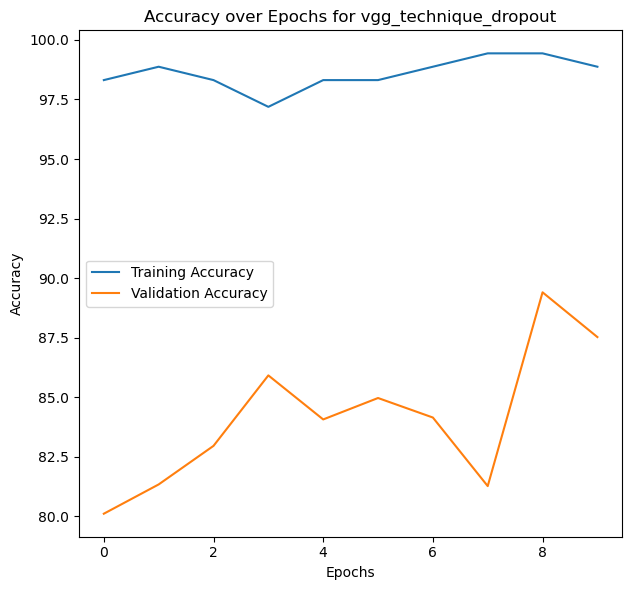

<u>c.training and validation loss over time (epochs).</u>

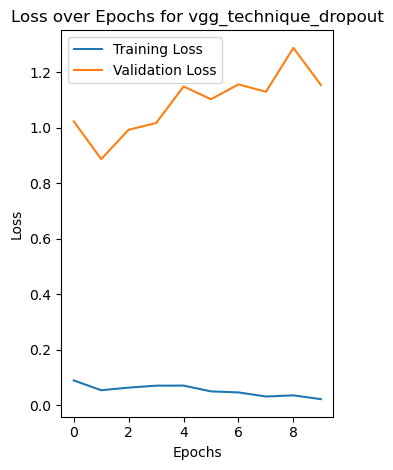

<u>d. Generate a confusion matrix for the test set </u>
<br>
<br>
<br>
The class which was misclassified most was class 0 - dogs
<br>
The class which was identified  correcty the most was class 2 - vehicles

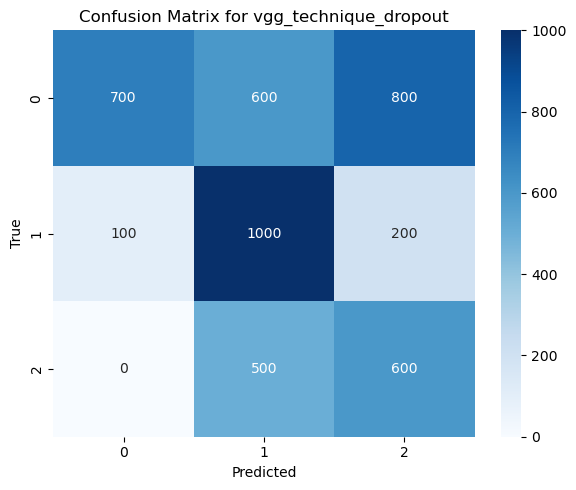

<u>e.Calculate and report other evaluation metrics such as precision, recall and
F1 score</u>

Test Accuracy: 84.0600, Test Loss: 1.8486 <br>
Precision: 0.6905, Recall: 0.6700, F1 Score: 0.6801 <br>
Best accuracy for VGG 16 model:  89.4 <br>
The model has 84.06% test accuracy with a 1.8486 test loss. Precision (0.6905) and recall (0.6700) show a decent balance, but there's room for improvement.

<u>g.few misclassified images.</u> <br><br><br>
According to our observations , the model fails to classify correctly when<br>
there is more than one object in image like the first two images in both rows in below


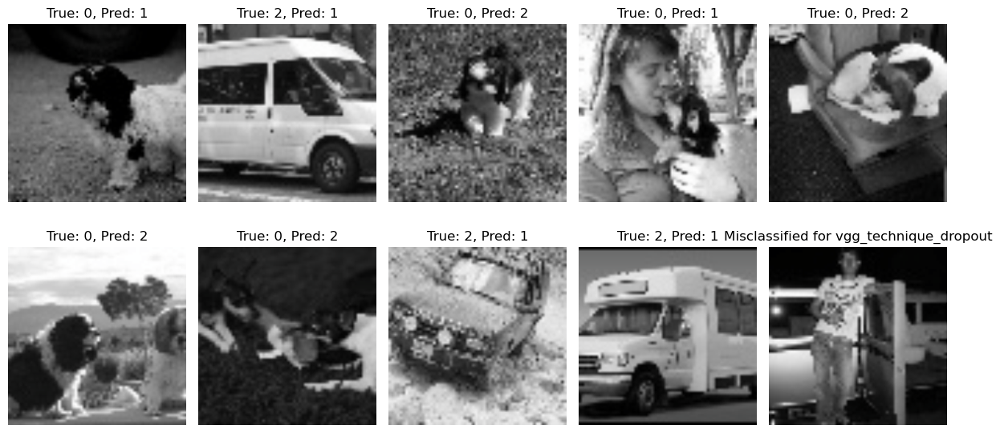

In [ ]:
# After all experiments are done, closing TensorBoard writer
writer.close()

The best accuracy was obtained with  89.4%

## Step 3: Implementing ResNet

1. Implement residual blocks of ResNet.

In [60]:
class BasicBlock(torch.nn.Module):
    def __init__(self, stride, inChannels, outChannels, batchNorm=False, dropout=0.3):
        super(BasicBlock, self).__init__()
        
        def convLayer(inC, outC, stride, batchNorm, dropout): # For batch Norm
            layers = [torch.nn.Conv2d(inC, outC, kernel_size=3, stride=stride, padding=1, bias=False)]
            if batchNorm:
                layers.append(torch.nn.BatchNorm2d(outC))
            layers.append(torch.nn.ReLU(inplace=True))
            layers.append(torch.nn.Dropout(dropout))
            return torch.nn.Sequential(*layers)

        self.conv1 = convLayer(inChannels, outChannels, stride, batchNorm, dropout)
        self.conv2 = convLayer(outChannels, outChannels, 1, batchNorm, dropout)

        self.shortcut = torch.nn.Sequential()
        if inChannels != outChannels or stride != 1:
            layers = [torch.nn.Conv2d(inChannels, outChannels, kernel_size=1, stride=stride, bias=False)]
            if batchNorm:
                layers.append(torch.nn.BatchNorm2d(outChannels))
            self.shortcut = torch.nn.Sequential(*layers)

    def forward(self, x):
        out = self.conv1(x)
        out = self.conv2(out)
        out = out + self.shortcut(x) # residual connection
        return torch.relu(out)

2. Assemble the ResNet-18 architecture.

In [ ]:
class ResNet18(torch.nn.Module):
    def __init__(self, numClasses = 3, batchNorm = False, dropout = 0.3):
        super(ResNet18, self).__init__()

        def convLayer(inC, outC, stride, batchNorm, dropout): # For batch Norm
            layers = [torch.nn.Conv2d(inC, outC, kernel_size=3, stride=stride, padding=1, bias=False)]
            if batchNorm:
                layers.append(torch.nn.BatchNorm2d(outC))
            layers.append(torch.nn.ReLU(inplace=True))
            layers.append(torch.nn.Dropout(dropout))
            return torch.nn.Sequential(*layers)

        self.conv1 = convLayer(3, 64, 2, batchNorm, dropout)
        self.maxpool = torch.nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.layer1 = self.makeLayer(2, 1, 64, 64, batchNorm, dropout) # layer1
        self.layer2 = self.makeLayer(2, 2, 64, 128, batchNorm, dropout)
        self.layer3 = self.makeLayer(2, 2, 128, 256, batchNorm, dropout) # layer 3
        self.layer4 = self.makeLayer(2, 2, 256, 512, batchNorm, dropout)

        self.avgpool = torch.nn.AdaptiveAvgPool2d((1, 1))
        self.fc = torch.nn.Linear(512, numClasses)
        self.dropout = torch.nn.Dropout(dropout)

    def makeLayer(self, blocks, stride, inChannels, outChannels, batchNorm, dropout):
        layers = []
        layers.append(BasicBlock(stride, inChannels, outChannels, batchNorm, dropout))
        for _ in range(1, blocks):
            layers.append(BasicBlock(1, outChannels, outChannels, batchNorm, dropout))
        return torch.nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.maxpool(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1) # flatten x
        x = self.dropout(x)
        x = self.fc(x) # FC layer

        return x

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = ResNet18(numClasses=3).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = torch.nn.CrossEntropyLoss()

# Initialize weights
def initializeWeights(model, weightType='xavier'):
    for m in model.modules():
        if isinstance(m, torch.nn.Conv2d) or isinstance(m, torch.nn.Linear):
            if weightType == 'he':
                torch.nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif weightType == 'xavier':
                torch.nn.init.xavier_uniform_(m.weight)
            elif weightType == 'normal':
                torch.nn.init.normal_(m.weight, mean=0, std=0.01)
            else:
                raise ValueError(f"Unknown weight initialization method {weightType}")
            if m.bias is not None:
                torch.nn.init.zeros_(m.bias)

print(torchinfo.summary(model, input_size=(64,3,224,224)))

Layer (type:depth-idx)                   Output Shape              Param #
ResNet18                                 [64, 3]                   --
├─Sequential: 1-1                        [64, 64, 112, 112]        --
│    └─Conv2d: 2-1                       [64, 64, 112, 112]        1,728
│    └─ReLU: 2-2                         [64, 64, 112, 112]        --
│    └─Dropout: 2-3                      [64, 64, 112, 112]        --
├─MaxPool2d: 1-2                         [64, 64, 56, 56]          --
├─Sequential: 1-3                        [64, 64, 56, 56]          --
│    └─BasicBlock: 2-4                   [64, 64, 56, 56]          --
│    │    └─Sequential: 3-1              [64, 64, 56, 56]          36,864
│    │    └─Sequential: 3-2              [64, 64, 56, 56]          36,864
│    │    └─Sequential: 3-3              [64, 64, 56, 56]          --
│    └─BasicBlock: 2-5                   [64, 64, 56, 56]          --
│    │    └─Sequential: 3-4              [64, 64, 56, 56]          36,864


3. Train the ResNet-18 model.


Experimenting with: Optimizer = adam
Iteration 1/10: Train Loss: 0.7399, Train Accuracy: 74.2697%, Val Loss: 0.7264, Val Accuracy: 78.9610%
Iteration 2/10: Train Loss: 0.7240, Train Accuracy: 81.0112%, Val Loss: 0.7194, Val Accuracy: 81.5584%
Iteration 3/10: Train Loss: 0.7085, Train Accuracy: 85.5056%, Val Loss: 0.7150, Val Accuracy: 81.5584%
Iteration 4/10: Train Loss: 0.6935, Train Accuracy: 84.9438%, Val Loss: 0.7094, Val Accuracy: 84.1558%
Iteration 5/10: Train Loss: 0.6878, Train Accuracy: 83.3300%, Val Loss: 0.7007, Val Accuracy: 81.5584%
Iteration 6/10: Train Loss: 0.6660, Train Accuracy: 83.7900%, Val Loss: 0.7082, Val Accuracy: 85.6400%
Iteration 7/10: Train Loss: 0.6862, Train Accuracy: 87.7528%, Val Loss: 0.6907, Val Accuracy: 84.1558%
Iteration 8/10: Train Loss: 0.6663, Train Accuracy: 85.0200%, Val Loss: 0.7026, Val Accuracy: 80.6100%
Iteration 9/10: Train Loss: 0.6659, Train Accuracy: 84.3700%, Val Loss: 0.6826, Val Accuracy: 82.8571%
Iteration 10/10: Train Loss: 0.6595

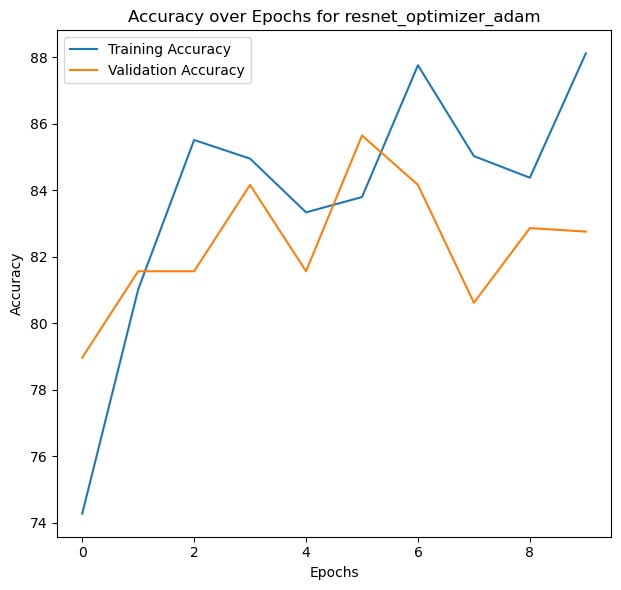

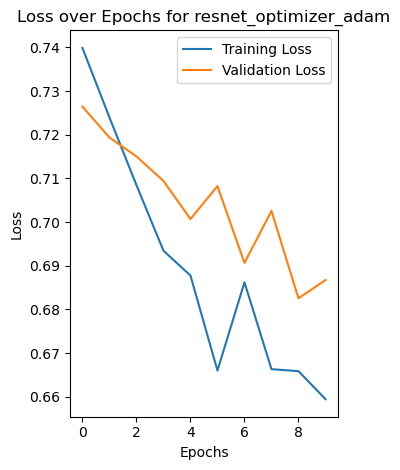

<Figure size 640x480 with 0 Axes>

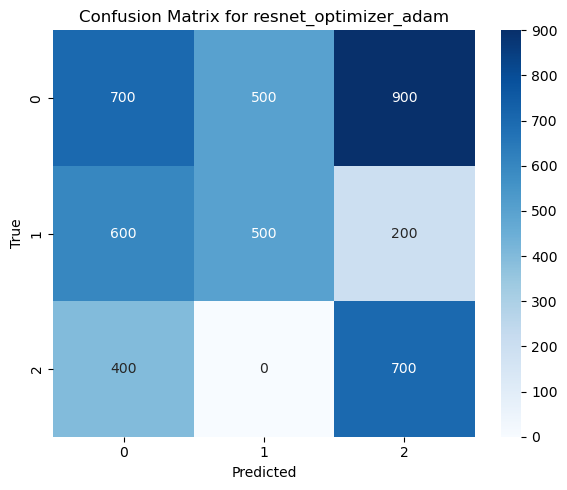

<Figure size 640x480 with 0 Axes>

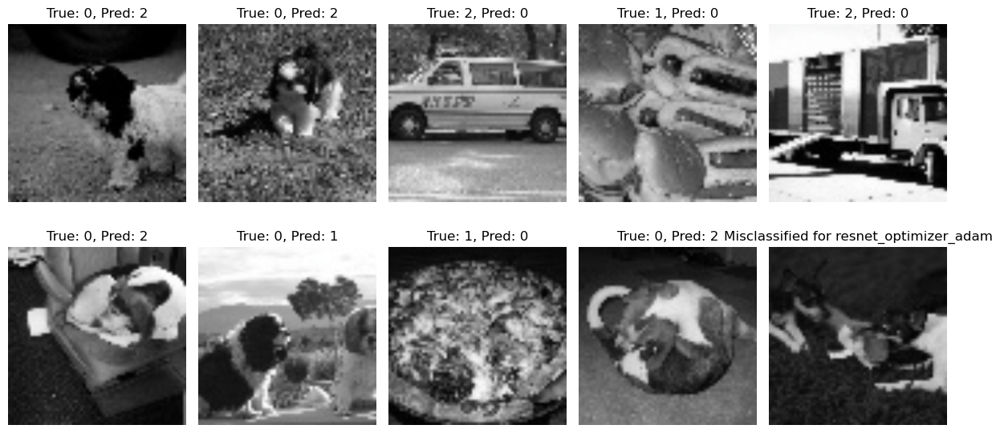


Experimenting with: Optimizer = sgd
Iteration 1/10: Train Loss: 0.6440, Train Accuracy: 81.0600%, Val Loss: 0.6859, Val Accuracy: 82.8571%
Iteration 2/10: Train Loss: 0.6465, Train Accuracy: 83.7700%, Val Loss: 0.6844, Val Accuracy: 84.1558%
Iteration 3/10: Train Loss: 0.6474, Train Accuracy: 80.6900%, Val Loss: 0.6829, Val Accuracy: 83.0600%
Iteration 4/10: Train Loss: 0.6354, Train Accuracy: 86.7900%, Val Loss: 0.6814, Val Accuracy: 84.0300%
Iteration 5/10: Train Loss: 0.6372, Train Accuracy: 85.4600%, Val Loss: 0.6802, Val Accuracy: 82.8571%
Iteration 6/10: Train Loss: 0.6432, Train Accuracy: 89.0500%, Val Loss: 0.6788, Val Accuracy: 84.1558%
Iteration 7/10: Train Loss: 0.6353, Train Accuracy: 84.9600%, Val Loss: 0.6780, Val Accuracy: 81.9200%
Iteration 8/10: Train Loss: 0.6343, Train Accuracy: 89.6900%, Val Loss: 0.6774, Val Accuracy: 81.4100%
Iteration 9/10: Train Loss: 0.6259, Train Accuracy: 80.8700%, Val Loss: 0.6764, Val Accuracy: 84.1558%
Iteration 10/10: Train Loss: 0.6433,

<Figure size 640x480 with 0 Axes>

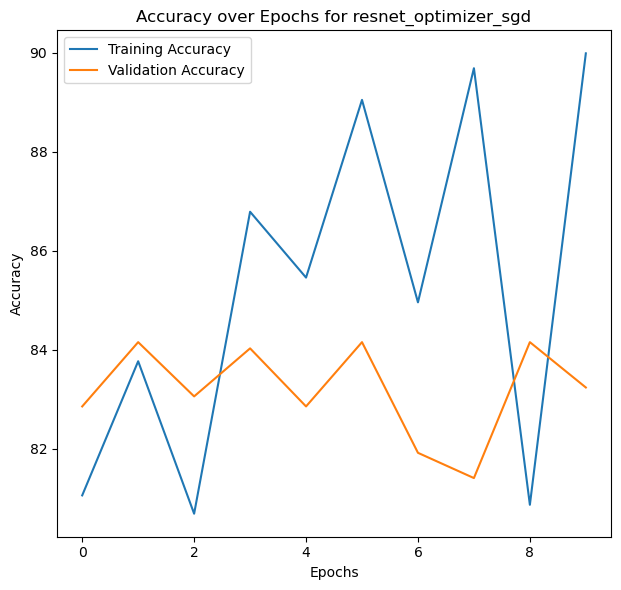

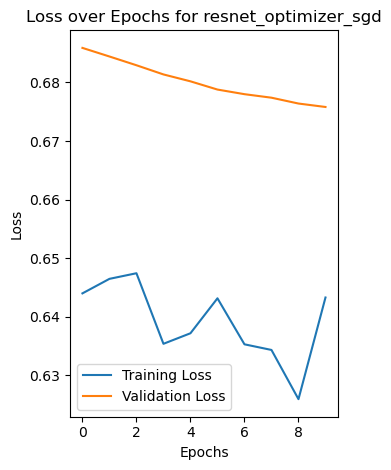

<Figure size 640x480 with 0 Axes>

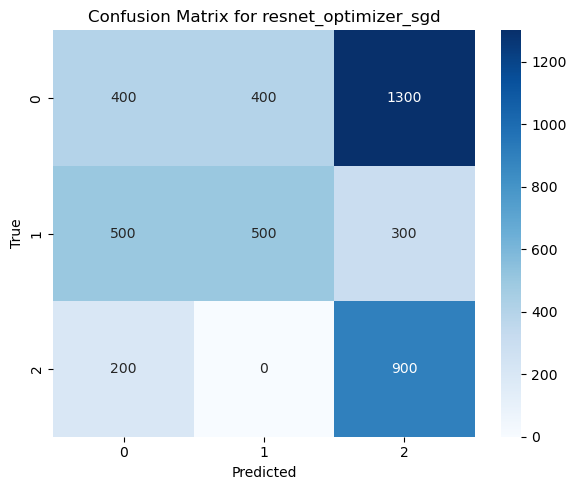

<Figure size 640x480 with 0 Axes>

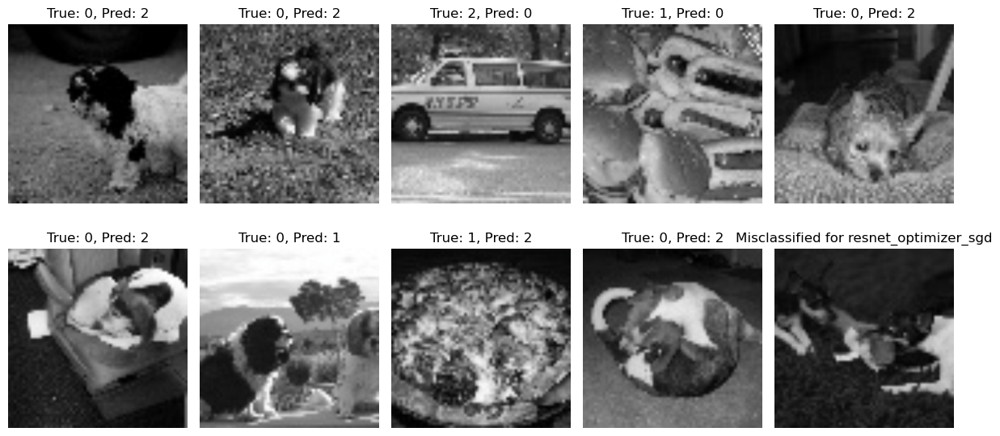


Experimenting with: Optimizer = adamw
Iteration 1/10: Train Loss: 0.6838, Train Accuracy: 83.2584%, Val Loss: 0.6916, Val Accuracy: 84.9100%
Iteration 2/10: Train Loss: 0.6510, Train Accuracy: 81.8300%, Val Loss: 0.6809, Val Accuracy: 85.4545%
Iteration 3/10: Train Loss: 0.6527, Train Accuracy: 81.4200%, Val Loss: 0.6694, Val Accuracy: 85.4545%
Iteration 4/10: Train Loss: 0.6299, Train Accuracy: 89.4700%, Val Loss: 0.6599, Val Accuracy: 81.5584%
Iteration 5/10: Train Loss: 0.6152, Train Accuracy: 80.7700%, Val Loss: 0.6431, Val Accuracy: 80.6300%
Iteration 6/10: Train Loss: 0.6150, Train Accuracy: 82.2100%, Val Loss: 0.6280, Val Accuracy: 88.3600%
Iteration 7/10: Train Loss: 0.5788, Train Accuracy: 85.1000%, Val Loss: 0.6343, Val Accuracy: 89.7100%
Iteration 8/10: Train Loss: 0.5961, Train Accuracy: 81.1200%, Val Loss: 0.6065, Val Accuracy: 83.5500%
Iteration 9/10: Train Loss: 0.5809, Train Accuracy: 87.6300%, Val Loss: 0.6197, Val Accuracy: 83.8900%
Iteration 10/10: Train Loss: 0.554

<Figure size 640x480 with 0 Axes>

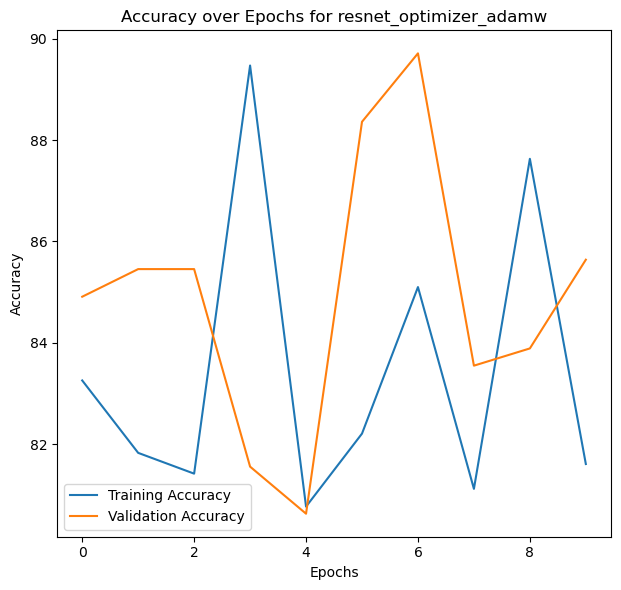

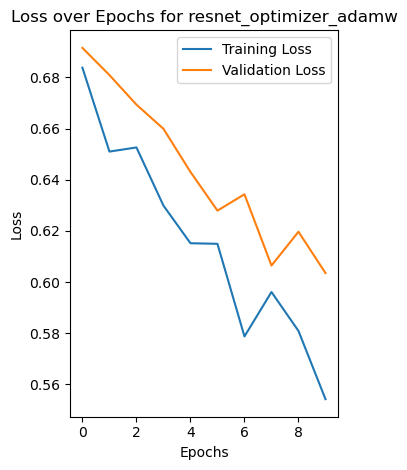

<Figure size 640x480 with 0 Axes>

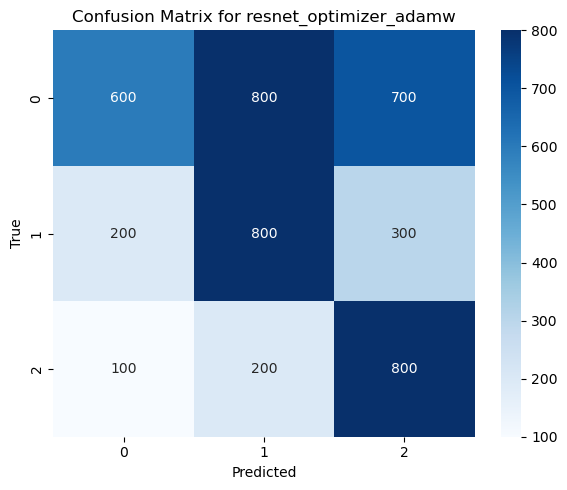

<Figure size 640x480 with 0 Axes>

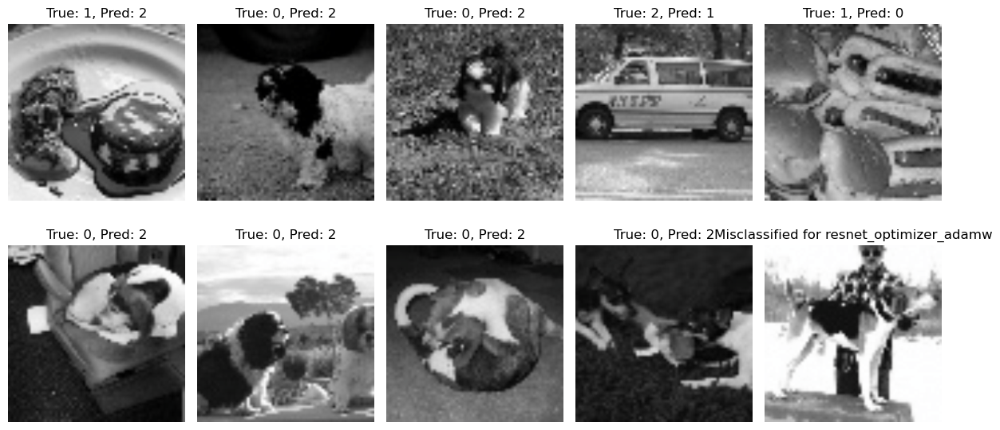


Experimenting with: Batch Size = 32
Iteration 1/10: Train Loss: 0.6332, Train Accuracy: 82.6900%, Val Loss: 0.6198, Val Accuracy: 84.4700%
Iteration 2/10: Train Loss: 0.5998, Train Accuracy: 81.4900%, Val Loss: 0.6349, Val Accuracy: 83.2500%
Iteration 3/10: Train Loss: 0.5593, Train Accuracy: 82.3700%, Val Loss: 0.6082, Val Accuracy: 83.9500%
Iteration 4/10: Train Loss: 0.5602, Train Accuracy: 80.2100%, Val Loss: 0.5945, Val Accuracy: 86.9900%
Iteration 5/10: Train Loss: 0.5369, Train Accuracy: 83.0600%, Val Loss: 0.5820, Val Accuracy: 80.5400%
Iteration 6/10: Train Loss: 0.5032, Train Accuracy: 80.8700%, Val Loss: 0.5983, Val Accuracy: 87.5300%
Iteration 7/10: Train Loss: 0.5419, Train Accuracy: 88.8100%, Val Loss: 0.5861, Val Accuracy: 80.0100%
Iteration 8/10: Train Loss: 0.5140, Train Accuracy: 81.7700%, Val Loss: 0.5929, Val Accuracy: 86.9900%
Iteration 9/10: Train Loss: 0.4819, Train Accuracy: 89.1100%, Val Loss: 0.5563, Val Accuracy: 89.3506%
Iteration 10/10: Train Loss: 0.4574,

<Figure size 640x480 with 0 Axes>

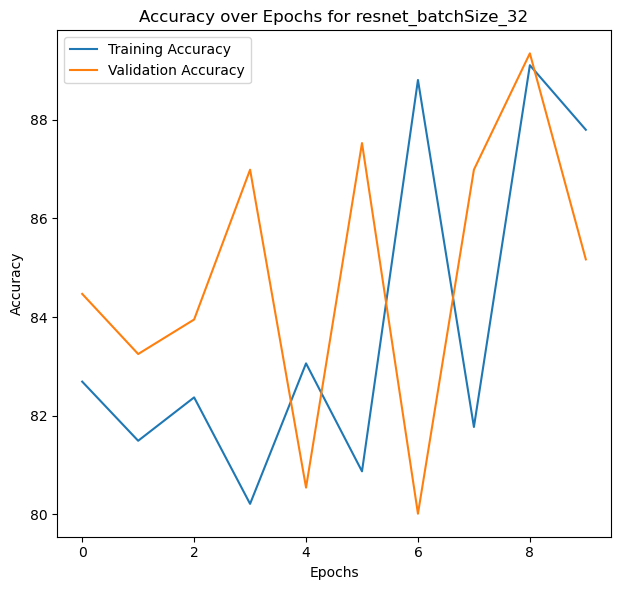

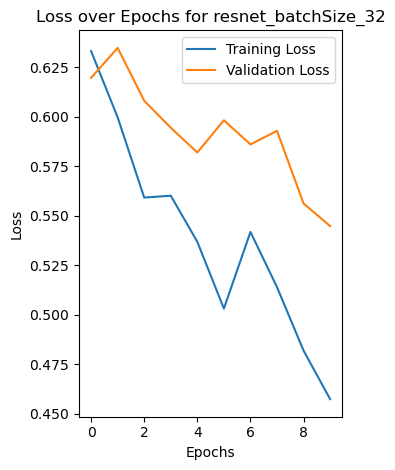

<Figure size 640x480 with 0 Axes>

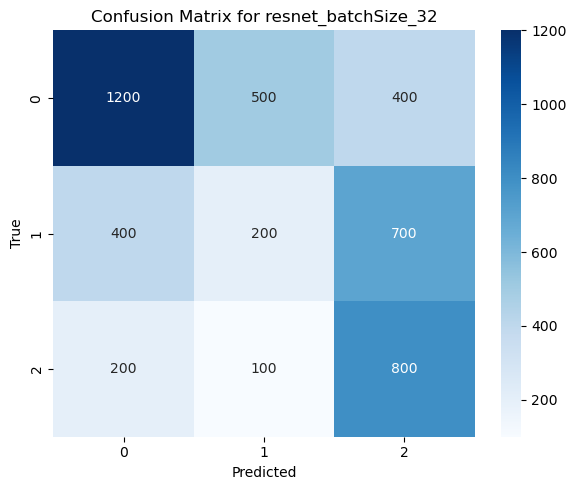

<Figure size 640x480 with 0 Axes>

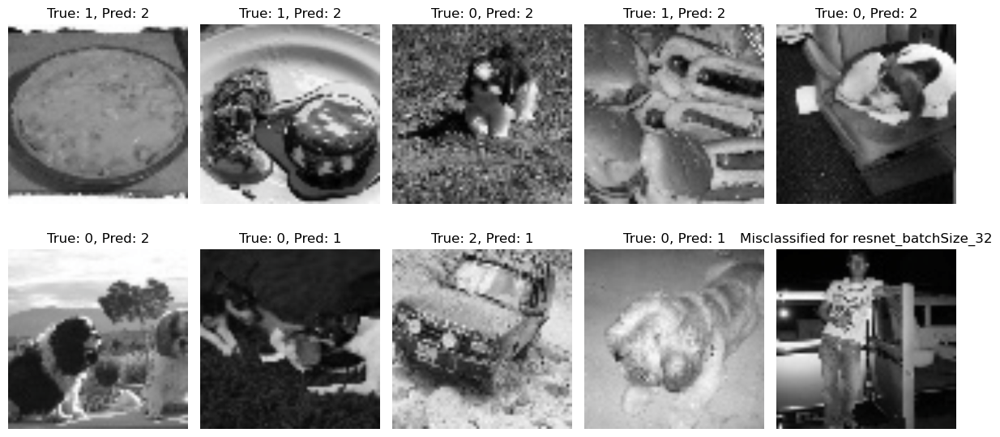


Experimenting with: Batch Size = 64
Iteration 1/10: Train Loss: 0.4168, Train Accuracy: 84.3400%, Val Loss: 0.5373, Val Accuracy: 80.0100%
Iteration 2/10: Train Loss: 0.4212, Train Accuracy: 80.9700%, Val Loss: 0.5344, Val Accuracy: 89.8900%
Iteration 3/10: Train Loss: 0.4164, Train Accuracy: 86.4500%, Val Loss: 0.5454, Val Accuracy: 82.7400%
Iteration 4/10: Train Loss: 0.3940, Train Accuracy: 83.8400%, Val Loss: 0.5621, Val Accuracy: 80.4700%
Iteration 5/10: Train Loss: 0.3864, Train Accuracy: 82.7200%, Val Loss: 0.5828, Val Accuracy: 85.1000%
Iteration 6/10: Train Loss: 0.3913, Train Accuracy: 81.2200%, Val Loss: 0.5475, Val Accuracy: 89.6100%
Iteration 7/10: Train Loss: 0.3868, Train Accuracy: 89.1200%, Val Loss: 0.5502, Val Accuracy: 88.1000%
Iteration 8/10: Train Loss: 0.3914, Train Accuracy: 81.1400%, Val Loss: 0.5429, Val Accuracy: 81.6800%
Iteration 9/10: Train Loss: 0.3443, Train Accuracy: 80.2100%, Val Loss: 0.5450, Val Accuracy: 84.2300%
Iteration 10/10: Train Loss: 0.3836,

<Figure size 640x480 with 0 Axes>

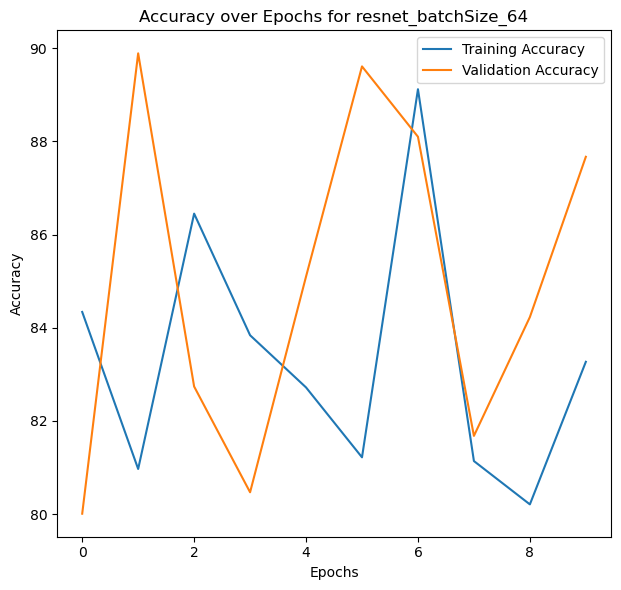

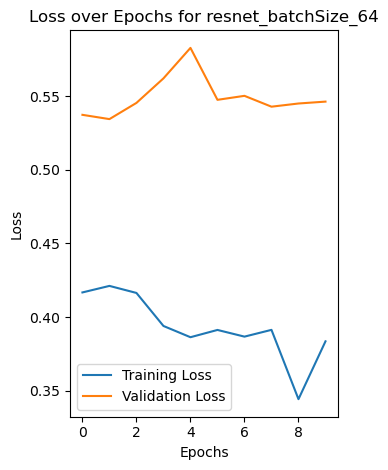

<Figure size 640x480 with 0 Axes>

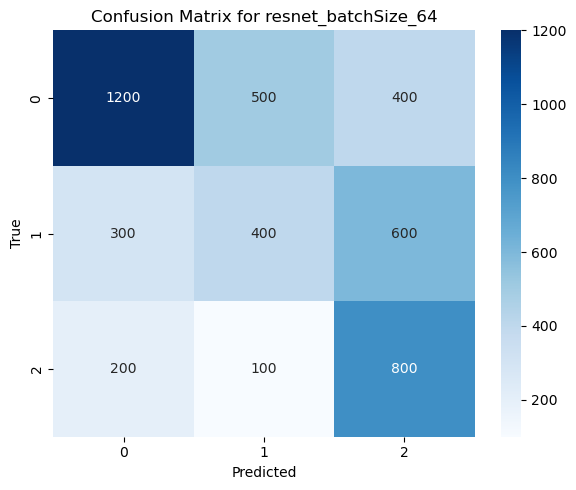

<Figure size 640x480 with 0 Axes>

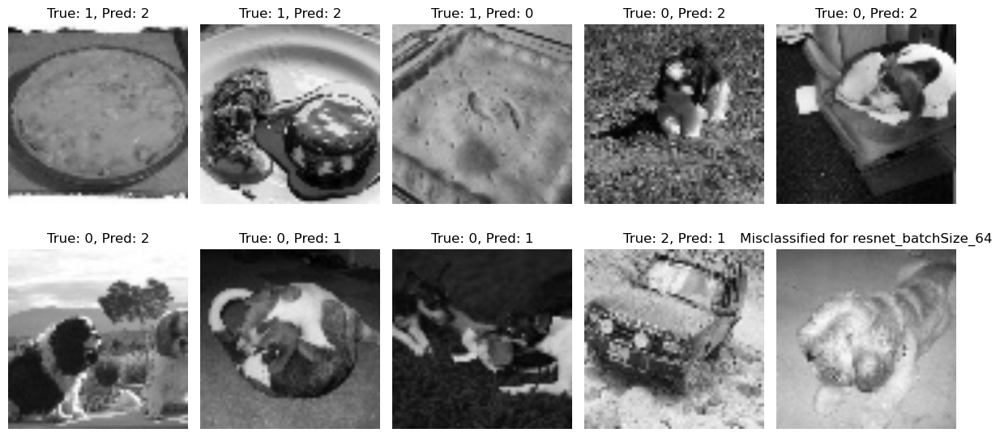


Experimenting with: Weight Type = xavier
Iteration 1/10: Train Loss: 1.4612, Train Accuracy: 70.8989%, Val Loss: 0.7801, Val Accuracy: 81.2300%
Iteration 2/10: Train Loss: 0.8654, Train Accuracy: 70.3371%, Val Loss: 0.7259, Val Accuracy: 68.5714%
Iteration 3/10: Train Loss: 0.7900, Train Accuracy: 72.5843%, Val Loss: 0.7237, Val Accuracy: 68.5714%
Iteration 4/10: Train Loss: 0.7722, Train Accuracy: 73.7079%, Val Loss: 0.7212, Val Accuracy: 72.4675%
Iteration 5/10: Train Loss: 0.7430, Train Accuracy: 72.0225%, Val Loss: 0.7221, Val Accuracy: 73.7662%
Iteration 6/10: Train Loss: 0.7276, Train Accuracy: 78.2022%, Val Loss: 0.7237, Val Accuracy: 81.5584%
Iteration 7/10: Train Loss: 0.7215, Train Accuracy: 78.2022%, Val Loss: 0.7251, Val Accuracy: 80.2597%
Iteration 8/10: Train Loss: 0.7151, Train Accuracy: 82.1348%, Val Loss: 0.7259, Val Accuracy: 82.8571%
Iteration 9/10: Train Loss: 0.7125, Train Accuracy: 87.1910%, Val Loss: 0.7257, Val Accuracy: 84.1558%
Iteration 10/10: Train Loss: 0.

<Figure size 640x480 with 0 Axes>

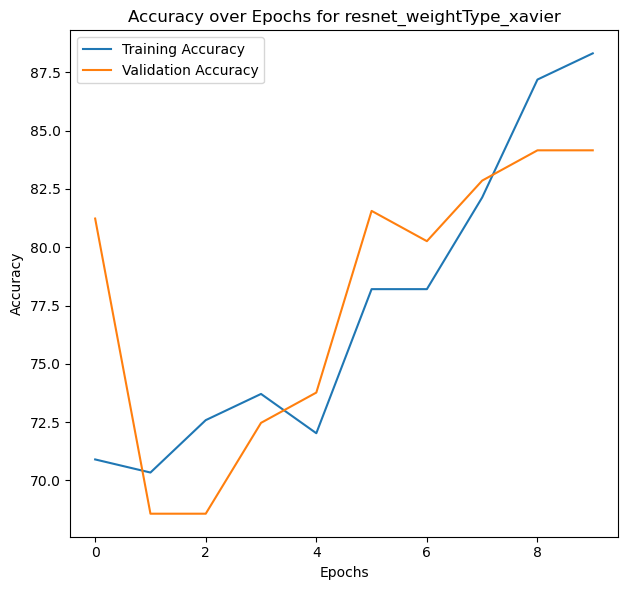

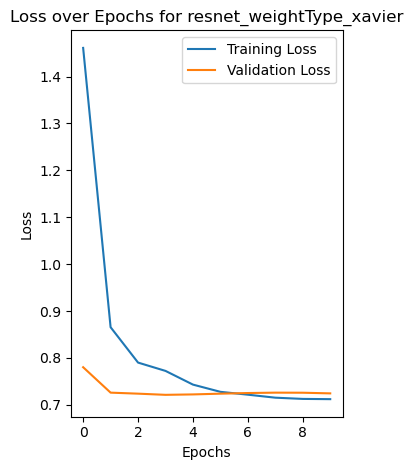

<Figure size 640x480 with 0 Axes>

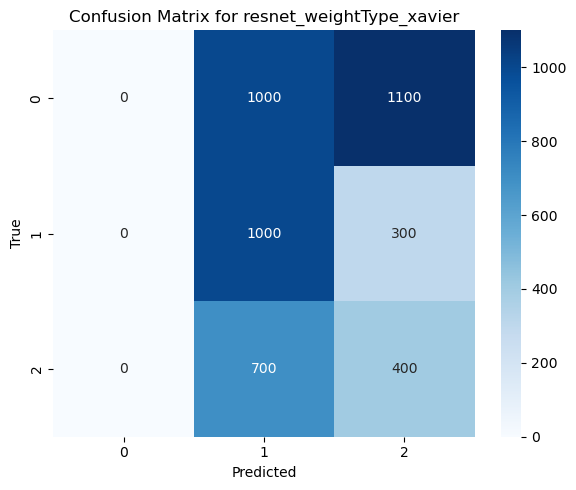

<Figure size 640x480 with 0 Axes>

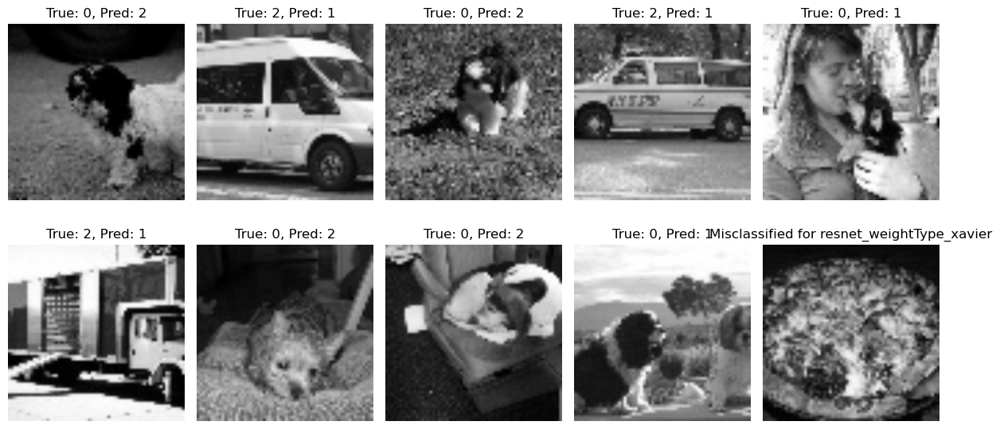


Experimenting with: Weight Type = he
Iteration 1/10: Train Loss: 0.8536, Train Accuracy: 73.7079%, Val Loss: 0.7574, Val Accuracy: 76.3636%
Iteration 2/10: Train Loss: 0.8025, Train Accuracy: 74.8315%, Val Loss: 0.7228, Val Accuracy: 76.3636%
Iteration 3/10: Train Loss: 0.7443, Train Accuracy: 75.3933%, Val Loss: 0.7310, Val Accuracy: 82.8571%
Iteration 4/10: Train Loss: 0.7291, Train Accuracy: 78.2022%, Val Loss: 0.7357, Val Accuracy: 82.8571%
Iteration 5/10: Train Loss: 0.7276, Train Accuracy: 78.7640%, Val Loss: 0.7251, Val Accuracy: 82.2000%
Iteration 6/10: Train Loss: 0.7067, Train Accuracy: 84.3820%, Val Loss: 0.7141, Val Accuracy: 80.2597%
Iteration 7/10: Train Loss: 0.7045, Train Accuracy: 80.4200%, Val Loss: 0.7124, Val Accuracy: 80.2597%
Iteration 8/10: Train Loss: 0.6916, Train Accuracy: 86.6292%, Val Loss: 0.7149, Val Accuracy: 80.0500%
Iteration 9/10: Train Loss: 0.6812, Train Accuracy: 80.5800%, Val Loss: 0.7166, Val Accuracy: 81.3300%
Iteration 10/10: Train Loss: 0.6915

<Figure size 640x480 with 0 Axes>

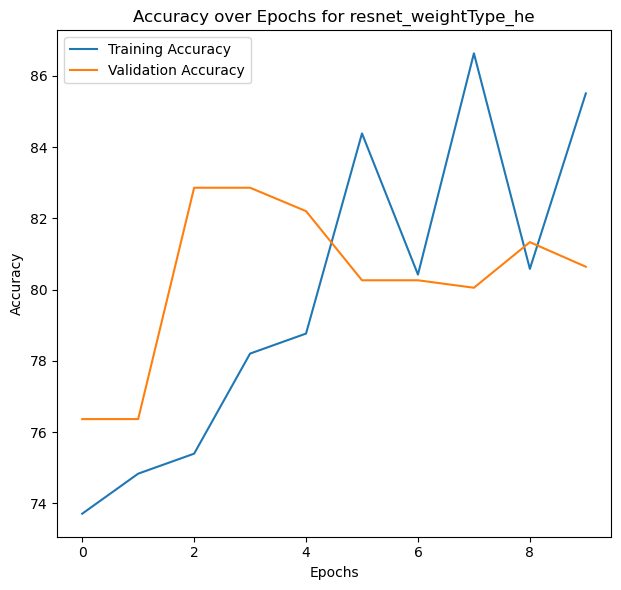

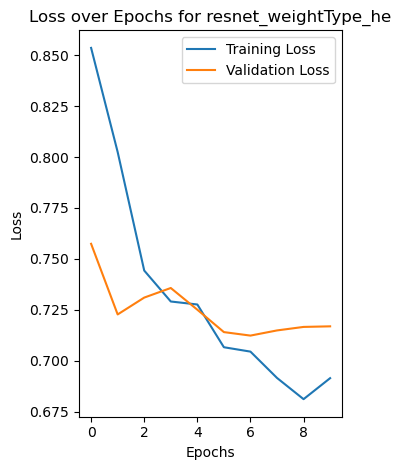

<Figure size 640x480 with 0 Axes>

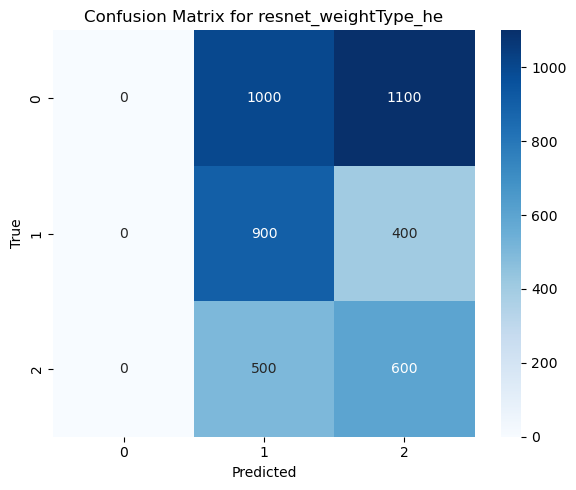

<Figure size 640x480 with 0 Axes>

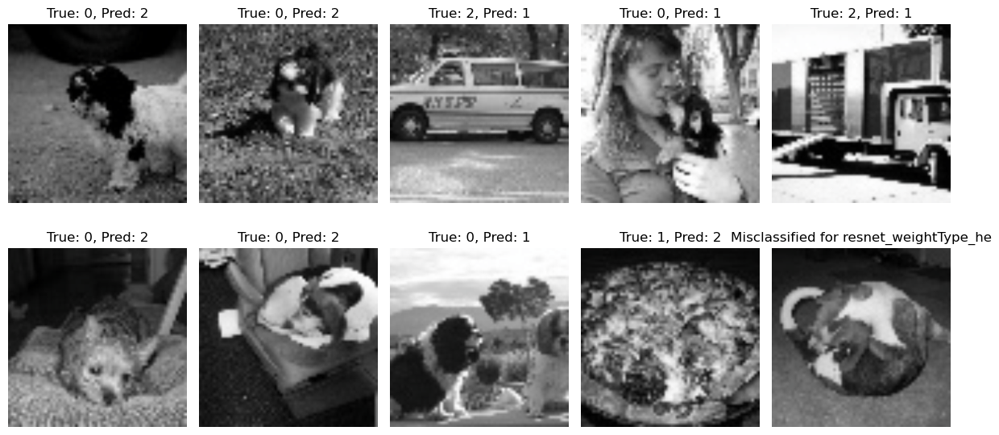

<Figure size 640x480 with 0 Axes>

In [ ]:

# Initialize TensorBoard writer
writer = SummaryWriter()
    

# Early Stopping Class
class EarlyStopping:
    def __init__(self, minDelta=0.001, patience=3):
        self.patience = patience
        self.minDelta = minDelta
        self.bestLoss = float('inf')
        self.counter = 0

    def __call__(self, valLoss):
        if valLoss < self.bestLoss - self.minDelta:
            self.bestLoss = valLoss
            self.counter = 0
        else:
            self.counter += 1
        return self.counter >= self.patience

def modelWithOptimizer(model, optimizerName, learningRate=0.0001, weightDecay=1e-4):
    if optimizerName == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=learningRate, weight_decay=weightDecay)
    elif optimizerName == 'sgd':
        optimizer = torch.optim.SGD(model.parameters(), lr=learningRate, momentum=0.9, weight_decay=weightDecay)
    elif optimizerName == 'adamw':
        optimizer = torch.optim.AdamW(model.parameters(), lr=learningRate, weight_decay=weightDecay)
    return optimizer

def modelWithBatchSize(batchSize):
    trainLoader = DataLoader(trainDataset, batch_size=batchSize, shuffle=True)
    valLoader = DataLoader(valDataset, batch_size=batchSize, shuffle=False)
    return trainLoader, valLoader

def modelWithWeightType(model, weightType):
    if weightType == 'xavier':
        initializeWeights(model, weightType)
    elif weightType == 'he':
        initializeWeights(model)
    return model

def modelWithTechnique(model, technique):
    if technique == 'batchNorm':
        model.batchNorm = True
    elif technique == 'dropout':
        model.dropout = torch.nn.Dropout(p=0.3)
    elif technique == 'earlystopping':
        model.earlyStopping = EarlyStopping(patience=10)
    return model

# Function to train the model
def trainResNetModel(model, trainLoader, valLoader, optimizer, criterion, device, iterations, earlyStopping=None):
    bestAccuracy = 0.0
    bestModel = None
    valLosses, trainLosses = [], []
    trainAccuracies, valAccuracies = [], []
    
    for iteration in range(iterations):
        model.train()
        runningLoss, correctTrain, totalTrain = 0.0, 0, 0
        
        for inputs, labels in trainLoader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels) # loss
            loss.backward()
            optimizer.step()
            
            _, predicted = torch.max(outputs, 1)
            totalTrain = totalTrain + labels.size(0)
            runningLoss = runningLoss + loss.item()
            correctTrain = correctTrain + (predicted == labels).sum().item()

        trainLoss = runningLoss / len(trainLoader)
        trainAccuracy = (correctTrain / totalTrain) * 100
        
        trainLosses.append(trainLoss)
        trainAccuracies.append(trainAccuracy)

        # Validation
        model.eval()
        correctVal, totalVal, valLoss = 0, 0, 0.0
        with torch.no_grad():
            for inputs, labels in valLoader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                _, predicted = torch.max(outputs, 1)
                totalVal = totalVal + labels.size(0)
                valLoss = valLoss + loss.item()
                correctVal = correctVal + (predicted == labels).sum().item()

        valLoss /= len(valLoader)
        valAccuracy =  (correctVal / totalVal) * 100 if totalVal > 0 else 0.0

        valLosses.append(valLoss)
        valAccuracies.append(valAccuracy)
        print(f'Iteration {iteration+1}/{iterations}: Train Loss: {trainLoss:.4f}, Train Accuracy: {trainAccuracy:.4f}%, Val Loss: {valLoss:.4f}, Val Accuracy: {valAccuracy:.4f}%')

        # Early Stopping Check
        if earlyStopping and earlyStopping(valLoss):
            print("Early stopping triggered")
            break

        if valAccuracy > bestAccuracy:
            bestAccuracy = valAccuracy
            bestModel = model

    return bestModel, bestAccuracy, trainAccuracies, valAccuracies, trainLosses, valLosses


# Evaluate model after training
def evaluateResNetModel(model, testLoader, device, criterion, numMisclassified=10):
    model.eval()
    correctTest = 0
    totalTest = 0
    testLoss = 0.0
    testPredictions = []
    testLabels = []
    misclassifiedSamples = []

    with torch.no_grad():
        for inputs, labels in testLoader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            _, predicted = torch.max(outputs, 1)
            totalTest = totalTest + labels.size(0)
            correctTest = correctTest + (predicted == labels).sum().item()
            testLoss = testLoss + loss.item()

            testLabels.extend(labels.cpu().numpy())
            testPredictions.extend(predicted.cpu().numpy()) # predictions
            for i in range(len(labels)):
                if labels[i] != predicted[i] and len(misclassifiedSamples) < numMisclassified:
                    misclassifiedSamples.append((inputs[i].cpu(), labels[i].item(), predicted[i].item()))


    testAccuracy = (correctTest / totalTest) * 100
    testLoss = testLoss / len(testLoader)

    print(f'Test Accuracy: {testAccuracy:.4f}, Test Loss: {testLoss:.4f}')

    # Precision, Recall, F1 Score
    precision, recall, f1, _ = precision_recall_fscore_support(testLabels, testPredictions, average='macro', zero_division=1)

    print(f'Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}')
    return testAccuracy, testLoss, testPredictions, testLabels, precision, recall, f1, misclassifiedSamples


# Function to plot metrics for each experiment
def plotMetrics(trainAccuracies, valAccuracies, trainLosses, valLosses, testLabels, testPredictions, misclassifiedSamples, title):
    plot.figure(figsize=(12, 6))

    # Accuracy Plot
    plot.subplot(1, 2, 1)
    plot.plot(trainAccuracies, label='Training Accuracy')
    plot.plot(valAccuracies, label='Validation Accuracy')
    plot.title(f"Accuracy over Epochs for {title}")
    plot.xlabel('Epochs')
    plot.ylabel('Accuracy')
    plot.legend()
    name = 'accuracyFor'+title
    plot.tight_layout()

    plot.savefig(name+'.svg', format='svg')
    plot.show()
    writer.add_figure(name, plot.gcf(), global_step=0)
    writer.flush()
    plot.clf()


    # Loss Plot
    plot.subplot(1, 2, 2)
    plot.plot(trainLosses, label='Training Loss')
    plot.plot(valLosses, label='Validation Loss')
    plot.xlabel('Epochs')
    plot.ylabel('Loss')
    plot.title(f"Loss over Epochs for {title}")
    plot.legend()
    name = 'lossFor'+title
    plot.tight_layout()
    plot.savefig(name+'.svg', format='svg')
    plot.show()
    writer.add_figure(name, plot.gcf(), global_step=0)
    writer.flush()
    plot.clf()


    # Confusion Matrix Plot
    confusionMatrix = confusion_matrix(testLabels, testPredictions)
    plot.figure(figsize=(6, 5))
    seaborn.heatmap(confusionMatrix, annot=True, fmt='d', cmap='Blues', xticklabels=numpy.arange(len(confusionMatrix)), yticklabels=numpy.arange(len(confusionMatrix)))
    plot.xlabel("Predicted")
    plot.ylabel("True")
    plot.title(f"Confusion Matrix for {title}")
    name = 'confusionMatrixFor'+title
    plot.tight_layout()
    plot.savefig(name+'.svg', format='svg')
    plot.show()
    writer.add_figure(name, plot.gcf(), global_step=0)
    writer.flush()
    plot.clf()


    # Misclassified
    if len(misclassifiedSamples) == 0:
        print("No misclassified images to display.")
        return

    fig, axes = plot.subplots(2, 5, figsize=(12, 6))  # Show up to 10 images
    axes = axes.flatten()

    for i, (image, true_label, predicted_label) in enumerate(misclassifiedSamples):
        image = image.permute(1, 2, 0).numpy()  # Convert to HWC format
        mean = numpy.array([0.485, 0.456, 0.406])
        std = numpy.array([0.229, 0.224, 0.225])
        image = image * std + mean  # Denormalize
        image = numpy.clip(image, 0, 1)  # Clip values

        axes[i].imshow(image)
        axes[i].set_title(f"True: {true_label}, Pred: {predicted_label}")
        axes[i].axis('off')

    plot.tight_layout()
    plot.title(f"Misclassified for {title}")
    name = 'MisclassifiedFor'+title
    plot.savefig(name+'.svg', format='svg')
    plot.show()
    writer.add_figure(name, plot.gcf(), global_step=0)
    writer.flush()
    plot.clf()



# Starting the experiments
optimizers = ['adam', 'sgd', 'adamw']
batchSizes = [32, 64]
initializations = ['xavier', 'he']
techniques = ['earlystopping', 'batchNorm', 'dropout']
bestResNetModelAfterAllExperiments = None
bestResNetAccuracyAfterAllExperiments = 0
bestResNetTrainingAccuracies = []
bestResNetTrainingLosses = []
bestResNetValidationAccuracies = []
bestResNetValidationLosses = []

results = []
allPredictions = []
allLabels = []

iterations = 10

# Optimizer
bestResNetOptimizer = 'adam'

# Loop through optimizers
for optimizerName in optimizers:
    print(f"\nExperimenting with: Optimizer = {optimizerName}")

    # Update the optimizer
    optimizer = modelWithOptimizer(model, optimizerName)
    
    bestModel, bestAccuracy, trainAccuracies, valAccuracies, trainLosses, valLosses = trainResNetModel(model, trainLoader, valLoader, optimizer, criterion, device, iterations)

    testAccuracy, testLoss, testPredictions, testLabels, precision, recall, f1, misclassifiedSamples = evaluateVGGModel(bestModel, testLoader, device, criterion, numMisclassified=10)
    
    if bestAccuracy > bestResNetAccuracyAfterAllExperiments:
        bestResNetAccuracyAfterAllExperiments = bestAccuracy
        bestResNetModelAfterAllExperiments = bestModel
        bestResNetTrainingAccuracies = trainAccuracies
        bestResNetTrainingLosses = trainLosses
        bestResNetValidationAccuracies = valAccuracies
        bestResNetValidationLosses = valLosses
        bestResNetOptimizer = optimizerName

    # Plot metrics for the experiment
    plotMetrics(trainAccuracies, valAccuracies, trainLosses, valLosses, testLabels, testPredictions, misclassifiedSamples, f'resnet_optimizer_{optimizerName}')


# Batch Size
bestResNetBatchSize = 32

optimizer = modelWithOptimizer(model, bestResNetOptimizer)

# Loop through batch sizes
for batchSize in batchSizes:
    print(f"\nExperimenting with: Batch Size = {batchSize}")

    trainLoader, valLoader = modelWithBatchSize(batchSize)

    bestModel, bestAccuracy, trainAccuracies, valAccuracies, trainLosses, valLosses = trainResNetModel(model, trainLoader, valLoader, optimizer, criterion, device, iterations)

    testAccuracy, testLoss, testPredictions, testLabels, precision, recall, f1, misclassifiedSamples = evaluateResNetModel(bestModel, testLoader, device, criterion, numMisclassified=10)
    
    if bestAccuracy > bestResNetAccuracyAfterAllExperiments:
        bestResNetAccuracyAfterAllExperiments = bestAccuracy
        bestResNetModelAfterAllExperiments = bestModel
        bestResNetTrainingAccuracies = trainAccuracies
        bestResNetTrainingLosses = trainLosses
        bestResNetValidationAccuracies = valAccuracies
        bestResNetValidationLosses = valLosses
        bestResNetBatchSize = batchSize
        

    # Plot metrics for the experiment
    plotMetrics(trainAccuracies, valAccuracies, trainLosses, valLosses, testLabels, testPredictions, misclassifiedSamples, f'resnet_batchSize_{batchSize}')


# Initialization Weights
bestResNetWeightType = 'xavier'

optimizer = modelWithOptimizer(model, bestResNetOptimizer)
trainLoader, valLoader = modelWithBatchSize(bestResNetBatchSize)

for weightType in initializations:
    print(f"\nExperimenting with: Weight Type = {weightType}")

    model = modelWithWeightType(model, weightType)

    bestModel, bestAccuracy, trainAccuracies, valAccuracies, trainLosses, valLosses = trainResNetModel(model, trainLoader, valLoader, optimizer, criterion, device, iterations)

    testAccuracy, testLoss, testPredictions, testLabels, precision, recall, f1, misclassifiedSamples = evaluateResNetModel(bestModel, testLoader, device, criterion, numMisclassified=10)
    
    if bestAccuracy > bestResNetAccuracyAfterAllExperiments:
        bestResNetAccuracyAfterAllExperiments = bestAccuracy
        bestResNetModelAfterAllExperiments = bestModel
        bestResNetTrainingAccuracies = trainAccuracies
        bestResNetTrainingLosses = trainLosses
        bestResNetValidationAccuracies = valAccuracies
        bestResNetValidationLosses = valLosses
        bestResNetWeightType = weightType
       

    # Plot metrics for the experiment
    plotMetrics(trainAccuracies, valAccuracies, trainLosses, valLosses, testLabels, testPredictions, misclassifiedSamples, f'resnet_weightType_{weightType}')

4. Apply regularization techniques.


Experimenting with: Performance Techniques = earlystopping
Iteration 1/10: Train Loss: 1.0038, Train Accuracy: 77.6404%, Val Loss: 0.7225, Val Accuracy: 69.8701%
Iteration 2/10: Train Loss: 0.8368, Train Accuracy: 72.5843%, Val Loss: 0.7218, Val Accuracy: 72.4675%
Iteration 3/10: Train Loss: 0.7567, Train Accuracy: 80.4494%, Val Loss: 0.7294, Val Accuracy: 84.3800%
Iteration 4/10: Train Loss: 0.7284, Train Accuracy: 77.0787%, Val Loss: 0.7354, Val Accuracy: 77.6623%
Iteration 5/10: Train Loss: 0.7287, Train Accuracy: 78.2022%, Val Loss: 0.7365, Val Accuracy: 78.9610%
Iteration 6/10: Train Loss: 0.7287, Train Accuracy: 76.5169%, Val Loss: 0.7351, Val Accuracy: 81.5584%
Iteration 7/10: Train Loss: 0.7235, Train Accuracy: 80.9600%, Val Loss: 0.7314, Val Accuracy: 81.5584%
Iteration 8/10: Train Loss: 0.7178, Train Accuracy: 81.5600%, Val Loss: 0.7266, Val Accuracy: 81.5584%
Iteration 9/10: Train Loss: 0.7177, Train Accuracy: 85.5056%, Val Loss: 0.7222, Val Accuracy: 84.1558%
Iteration 10/

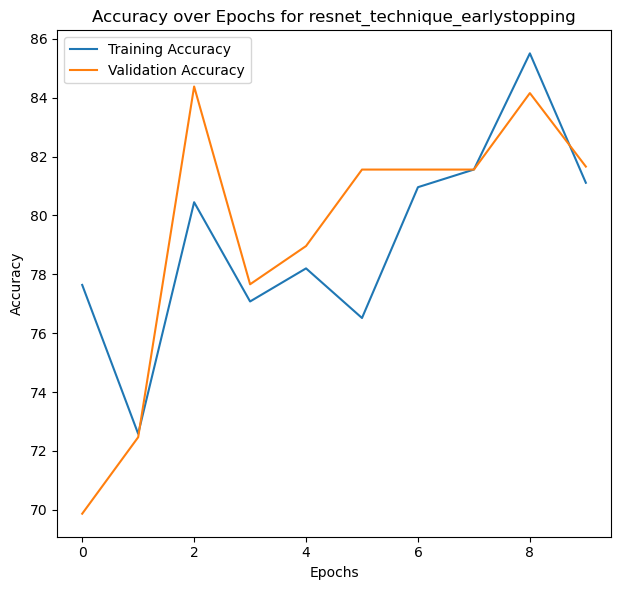

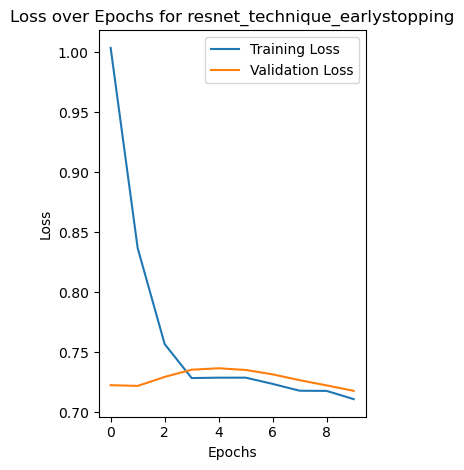

<Figure size 640x480 with 0 Axes>

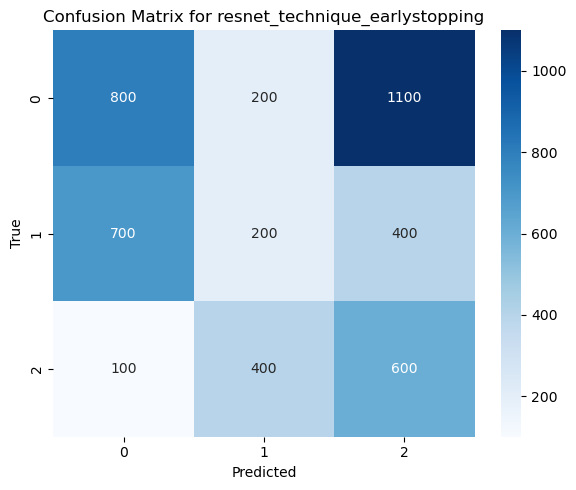

<Figure size 640x480 with 0 Axes>

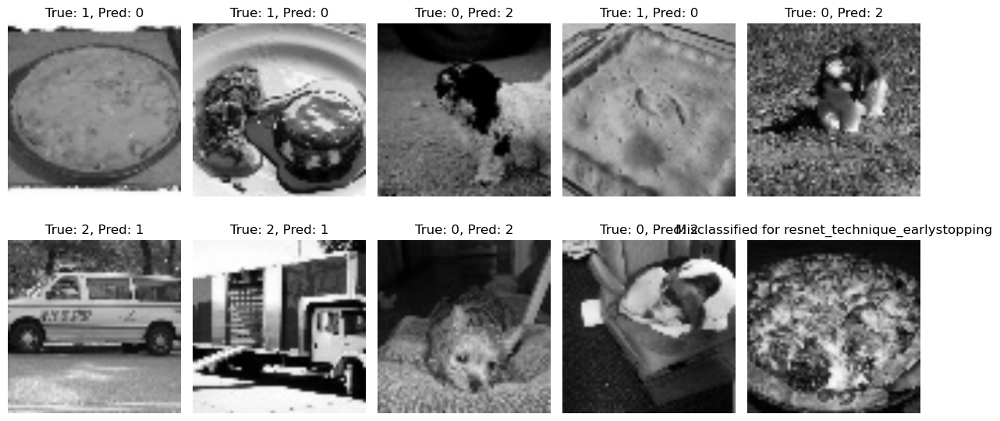


Experimenting with: Performance Techniques = batchNorm
Iteration 1/10: Train Loss: 0.7036, Train Accuracy: 80.6000%, Val Loss: 0.7132, Val Accuracy: 78.9610%
Iteration 2/10: Train Loss: 0.6966, Train Accuracy: 85.2300%, Val Loss: 0.7094, Val Accuracy: 81.3600%
Iteration 3/10: Train Loss: 0.6997, Train Accuracy: 82.6100%, Val Loss: 0.7070, Val Accuracy: 81.5584%
Iteration 4/10: Train Loss: 0.6906, Train Accuracy: 85.5056%, Val Loss: 0.7075, Val Accuracy: 80.2597%
Iteration 5/10: Train Loss: 0.6879, Train Accuracy: 80.2300%, Val Loss: 0.7068, Val Accuracy: 84.1558%
Iteration 6/10: Train Loss: 0.6856, Train Accuracy: 81.3100%, Val Loss: 0.7097, Val Accuracy: 78.9610%
Iteration 7/10: Train Loss: 0.6867, Train Accuracy: 84.9438%, Val Loss: 0.7048, Val Accuracy: 81.8500%
Iteration 8/10: Train Loss: 0.6801, Train Accuracy: 84.3800%, Val Loss: 0.6992, Val Accuracy: 84.9300%
Iteration 9/10: Train Loss: 0.6672, Train Accuracy: 80.2600%, Val Loss: 0.6974, Val Accuracy: 80.5100%
Iteration 10/10: 

<Figure size 640x480 with 0 Axes>

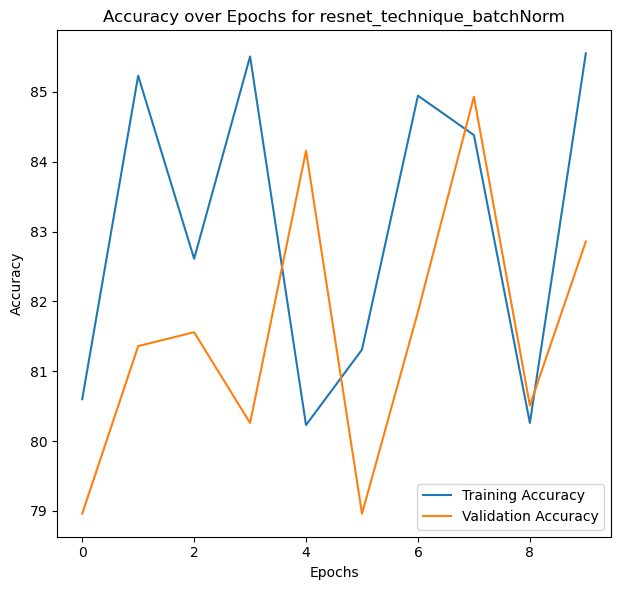

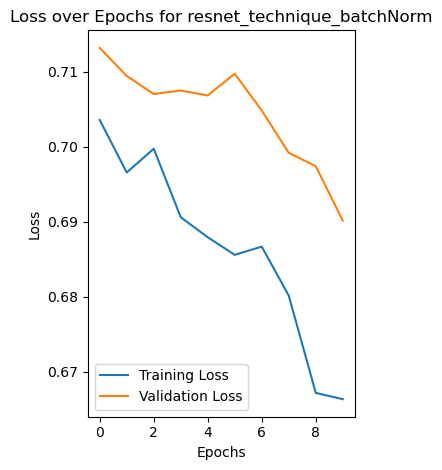

<Figure size 640x480 with 0 Axes>

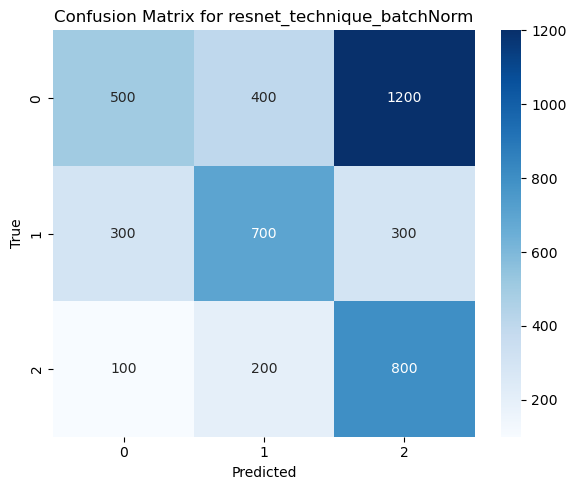

<Figure size 640x480 with 0 Axes>

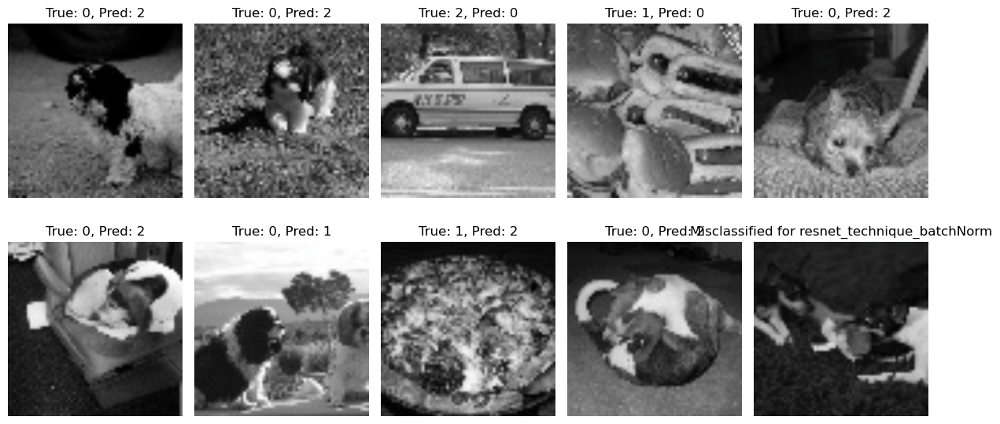


Experimenting with: Performance Techniques = dropout
Iteration 1/10: Train Loss: 0.6600, Train Accuracy: 86.4700%, Val Loss: 0.6823, Val Accuracy: 81.8400%
Iteration 2/10: Train Loss: 0.6493, Train Accuracy: 89.4200%, Val Loss: 0.6848, Val Accuracy: 84.1558%
Iteration 3/10: Train Loss: 0.6733, Train Accuracy: 81.3600%, Val Loss: 0.6843, Val Accuracy: 84.7200%
Iteration 4/10: Train Loss: 0.6607, Train Accuracy: 82.4300%, Val Loss: 0.6725, Val Accuracy: 84.1000%
Iteration 5/10: Train Loss: 0.6442, Train Accuracy: 87.4100%, Val Loss: 0.6862, Val Accuracy: 82.8571%
Iteration 6/10: Train Loss: 0.6652, Train Accuracy: 84.8000%, Val Loss: 0.6673, Val Accuracy: 83.1500%
Iteration 7/10: Train Loss: 0.6403, Train Accuracy: 89.3700%, Val Loss: 0.6621, Val Accuracy: 82.9900%
Iteration 8/10: Train Loss: 0.6441, Train Accuracy: 85.4300%, Val Loss: 0.6687, Val Accuracy: 84.1558%
Iteration 9/10: Train Loss: 0.6246, Train Accuracy: 84.6500%, Val Loss: 0.6493, Val Accuracy: 85.4200%
Iteration 10/10: Tr

<Figure size 640x480 with 0 Axes>

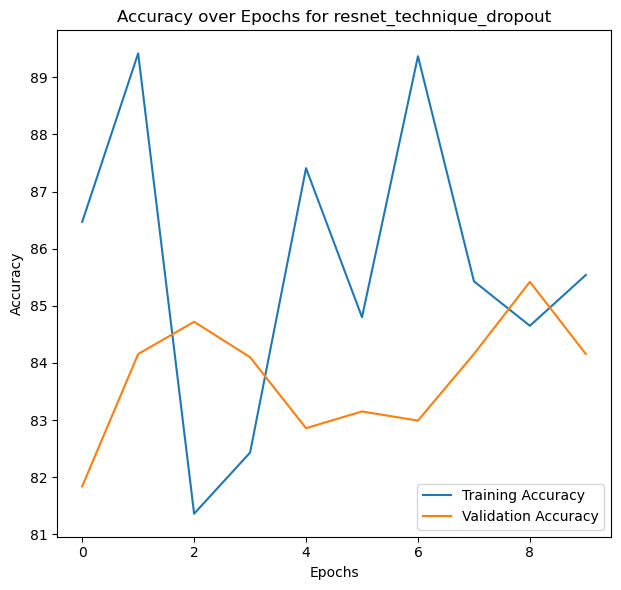

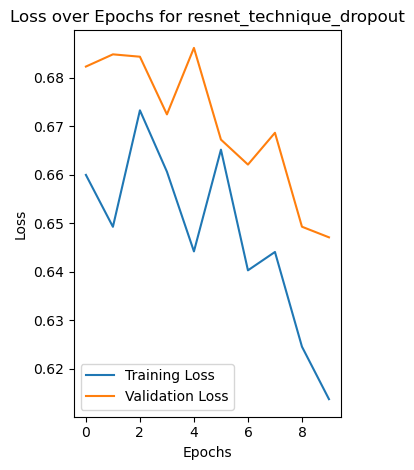

<Figure size 640x480 with 0 Axes>

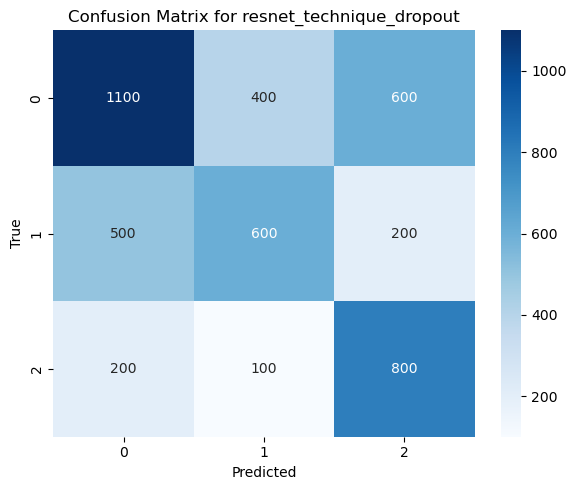

<Figure size 640x480 with 0 Axes>

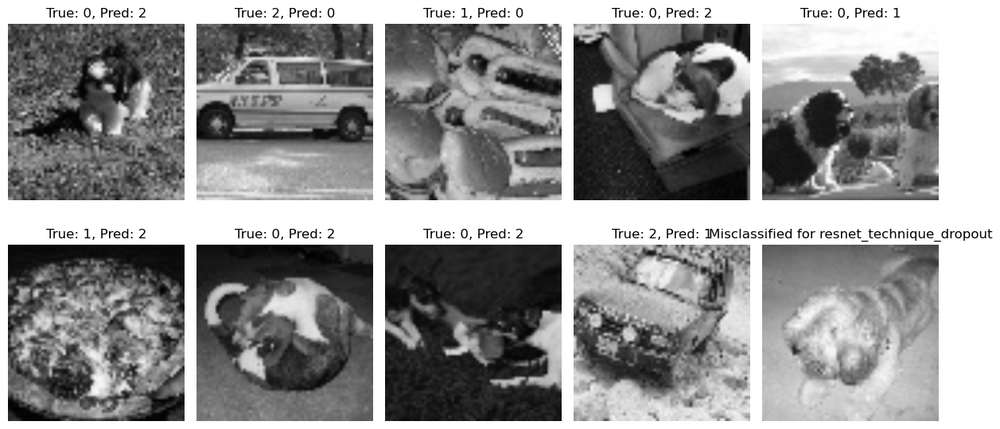

<Figure size 640x480 with 0 Axes>

In [66]:
# Techniques
bestResNetTechnique = None

optimizer = modelWithOptimizer(model, bestResNetOptimizer)
trainLoader, valLoader = modelWithBatchSize(bestResNetBatchSize)
model = modelWithWeightType(model, bestResNetWeightType)


for technique in techniques:
    print(f"\nExperimenting with: Performance Techniques = {technique}")

    earlyStopping = EarlyStopping(patience=10) if technique == 'earlystopping' else None
    model = modelWithTechnique(model, technique)

    bestModel, bestAccuracy, trainAccuracies, valAccuracies, trainLosses, valLosses = trainResNetModel(model, trainLoader, valLoader, optimizer, criterion, device, iterations, earlyStopping = earlyStopping)

    testAccuracy, testLoss, testPredictions, testLabels, precision, recall, f1, misclassifiedSamples = evaluateResNetModel(bestModel, testLoader, device, criterion, numMisclassified=10)
    
    if bestAccuracy > bestResNetAccuracyAfterAllExperiments:
        bestResNetAccuracyAfterAllExperiments = bestAccuracy
        bestResNetModelAfterAllExperiments = bestModel
        bestResNetTrainingAccuracies = trainAccuracies
        bestResNetTrainingLosses = trainLosses
        bestResNetValidationAccuracies = valAccuracies
        bestResNetValidationLosses = valLosses
        bestResNetTechnique = technique
       

    # Plot metrics for the experiment
    plotMetrics(trainAccuracies, valAccuracies, trainLosses, valLosses, testLabels, testPredictions, misclassifiedSamples, f'resnet_technique_{technique}')


<u>a.a.Training accuracy, training loss, validation accuracy, validation loss, testing</u>

The best results were achieved for **ResNet** using **AdamW** as the optimizer, a **batch size of 64**, and **Xavier weight initialization**.<br>
Despite experimenting with dropout, batch normalization, and early stoppingnone of these techniques improved the performance further.

Experimenting with: Batch Size = 64 <br>
Iteration 1/10: Train Loss: 0.4168, Train Accuracy: 84.3400%, Val Loss: 0.5373, Val Accuracy: 80.0100% <br>
Iteration 2/10: Train Loss: 0.4212, Train Accuracy: 80.9700%, Val Loss: 0.5344, Val Accuracy: 89.8900% <br>
Iteration 3/10: Train Loss: 0.4164, Train Accuracy: 86.4500%, Val Loss: 0.5454, Val Accuracy: 82.7400% <br>
Iteration 4/10: Train Loss: 0.3940, Train Accuracy: 83.8400%, Val Loss: 0.5621, Val Accuracy: 80.4700% <br>
Iteration 5/10: Train Loss: 0.3864, Train Accuracy: 82.7200%, Val Loss: 0.5828, Val Accuracy: 85.1000% <br>
Iteration 6/10: Train Loss: 0.3913, Train Accuracy: 81.2200%, Val Loss: 0.5475, Val Accuracy: 89.6100% <br>
Iteration 7/10: Train Loss: 0.3868, Train Accuracy: 89.1200%, Val Loss: 0.5502, Val Accuracy: 88.1000% <br>
Iteration 8/10: Train Loss: 0.3914, Train Accuracy: 81.1400%, Val Loss: 0.5429, Val Accuracy: 81.6800% <br>
Iteration 9/10: Train Loss: 0.3443, Train Accuracy: 80.2100%, Val Loss: 0.5450, Val Accuracy: 84.2300% <br>
Iteration 10/10: Train Loss: 0.3836, Train Accuracy: 83.2700%, Val Loss: 0.5463, Val Accuracy: 87.6700% <br>
Test Accuracy: 87.0000, Test Loss: 0.6617 <br>
Precision: 0.6626, Recall: 0.7731, F1 Score: 0.7136 <br>
Best accuracy for ResNet model:  89.89 <br>

<u>a.b.training and validation accuracy over time (epochs).</u>

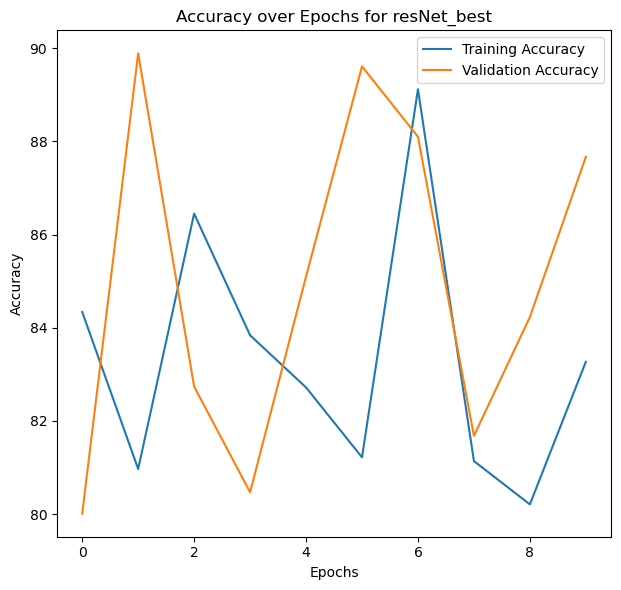

<u>a.c.training and validation loss over time (epochs).</u>

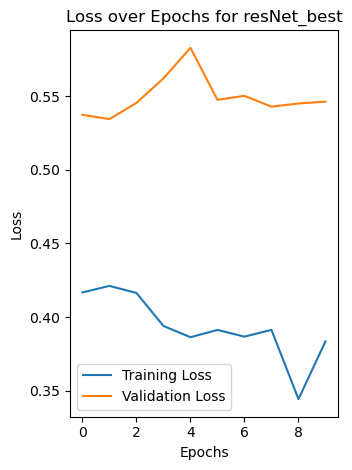

<u>a.d.Generate a confusion matrix for the test set</u>

Here as well similar to vgg, the mostly misclassified class was that of class 0 dogs and mostly classified correctly was vehicles. 

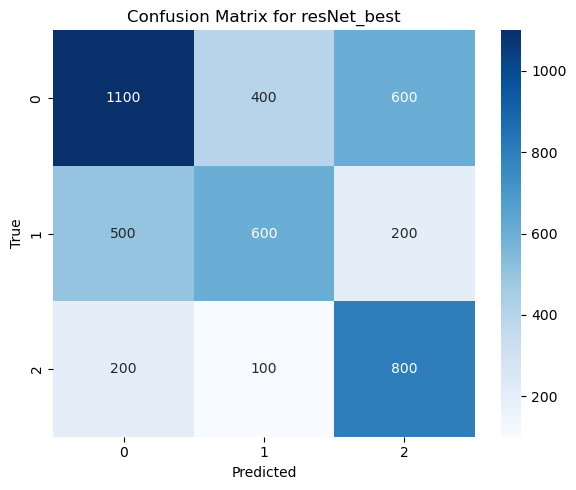

<u>a.e.Calculate and report other evaluation metrics such as precision, recall and
F1 score</u>

Test Accuracy: 87.0000, Test Loss: 0.6617 <br>
Precision: 0.6626, Recall: 0.7731, F1 Score: 0.7136 <br>
Best val accuracy for ResNet model:  89.89 <br>
The model achieved 87.00% test accuracy with a test loss of 0.6626. The precision (0.6626) is high, indicating fewer false positives. The F1 score of 0.7136 suggests a solid balance between precision and recall, reflecting good overall performance.

<u>a.g.few misclassified images</u>

Similar to the case with VGG, the images are misclassifed if there are more than one object in the image.

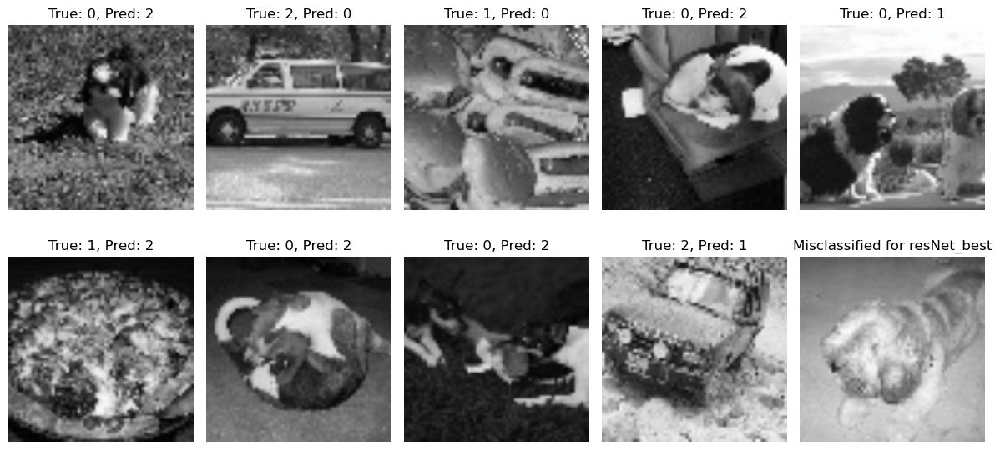

<u>b. compare the performance of ResNet-18
and VGG-16.</u>

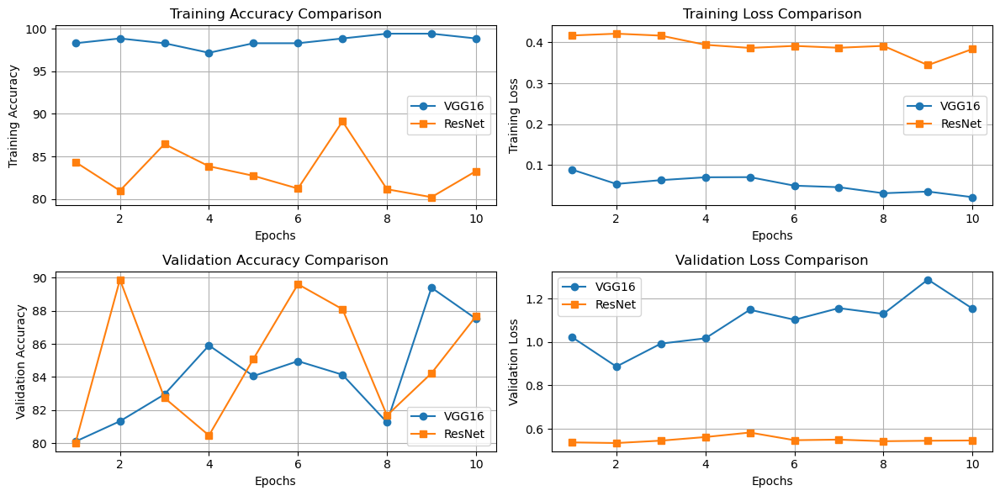

VGG Accuracy:  89.4 <br>
VGG Training Losses:  [0.08895892029007275, 0.05375695383797089, 0.06315898646910985, 0.07012745396544535, 0.07043919914091627, 0.04960936649392048, 0.04586330785726508, 0.03110610965328912, 0.03521840771039327, 0.02155230943268786] <br>
VGG Validation Losses:  [1.0225013891855876, 0.886545287238227, 0.9923242727915446, 1.0166859361860487, 1.1482821570502388, 1.102276537153456, 1.155759334564209, 1.129167742199368, 1.2872660954793294, 1.1538496547275119] <br>
VGG Training Accuracies:  [98.31460674157303, 98.87640449438202, 98.31460674157303, 97.19101123595506, 98.31460674157303, 98.31460674157303, 98.87640449438202, 99.43820224719101, 99.43820224719101, 98.87640449438202] <br>
VGG Validation Accuracies:  [80.1, 81.33, 82.95, 85.91, 84.06, 84.96, 84.14, 81.26, 89.4, 87.52] <br>
<br>
ResNet Accuracy:  89.89 <br>
ResNet Training Losses:  [0.41678253809611004, 0.4212157064014011, 0.4164380364947849, 0.39402380254533553, 0.38638540108998615, 0.3913257122039795, 0.3867870569229126, 0.39138139618767637, 0.344346092806922, 0.3835979633861118] <br>
ResNet Validation Losses:  [0.5373266339302063, 0.5344269474347433, 0.545424222946167, 0.5620676080385844, 0.5827588240305582, 0.5475132862726847, 0.5502207477887472, 0.5428567330042521, 0.5450202425320944, 0.5462995370229086] <br>
ResNet Training Accuracies:  [84.34, 80.97, 86.45, 83.84, 82.72, 81.22, 89.12, 81.14, 80.21, 83.27] <br>
ResNet Validation Accuracies:  [80.01, 89.89, 82.74, 80.47, 85.1, 89.61, 88.1, 81.68, 84.23, 87.67]

It can be observed that the value of  test accuracy after 10 epochs are almost same for both vgg and resnet but resnet performed better.

In [ ]:
# After all experiments are done, closing TensorBoard writer
writer.close()